In [204]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/telco-customer-churn/WA_Fn-UseC_-Telco-Customer-Churn.csv


# IMPORT THE LIBRARIES

In [205]:
from warnings import filterwarnings
filterwarnings("ignore")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows',None)
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
from scipy import stats
from sklearn.model_selection import train_test_split
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,roc_auc_score,roc_curve
from sklearn.model_selection import cross_val_score,KFold,cross_val_score,cross_validate
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.tree import plot_tree
from xgboost import plot_tree,plot_importance
from sklearn import tree
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from yellowbrick.classifier import ClassificationReport, confusion_matrix,precision_recall_curve,PrecisionRecallCurve,ConfusionMatrix,ROCAUC,DiscriminationThreshold
from yellowbrick.model_selection import FeatureImportances,learning_curve,LearningCurve
from yellowbrick.target import class_balance
import itertools
from sklearn.experimental import enable_hist_gradient_boosting  
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, VotingClassifier,GradientBoostingClassifier,AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
from lightgbm import LGBMClassifier
from scipy.stats import boxcox
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from catboost import CatBoostClassifier
from imblearn.over_sampling import SMOTE,BorderlineSMOTE,KMeansSMOTE
from imblearn.under_sampling import NearMiss,RandomUnderSampler

# EXPLORATORY DATA ANALYSIS (EDA)

In [206]:
data=pd.read_csv("/kaggle/input/telco-customer-churn/WA_Fn-UseC_-Telco-Customer-Churn.csv")
df=data.copy()
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [207]:
print("Number of Columns :{0} \nNumber of Rows : {1}".format(df.shape[0],df.shape[1]))

Number of Columns :7043 
Number of Rows : 21


In [208]:
df.dtypes

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges         object
Churn                object
dtype: object

In [209]:
df.loc[df.TotalCharges==" ","TotalCharges"]=np.nan

In [210]:
df.TotalCharges=df.TotalCharges.astype(float)

In [211]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
SeniorCitizen,7043.0,0.162147,0.368612,0.00,0.00,0.000,0.0000,1.00
tenure,7043.0,32.371149,24.559481,0.00,9.00,29.000,55.0000,72.00
MonthlyCharges,7043.0,64.761692,30.090047,18.25,35.50,70.350,89.8500,118.75
TotalCharges,7032.0,2283.300441,2266.771362,18.80,401.45,1397.475,3794.7375,8684.80


In [212]:
df.SeniorCitizen=df["SeniorCitizen"].replace({0:"No",1:"Yes"})

In [213]:
df.describe(include=["object"]).T

,count,unique,top,freq
customerID,7043,7043,1977-STDKI,1
gender,7043,2,Male,3555
SeniorCitizen,7043,2,No,5901
Partner,7043,2,No,3641
Dependents,7043,2,No,4933
PhoneService,7043,2,Yes,6361
MultipleLines,7043,3,No,3390
InternetService,7043,3,Fiber optic,3096
OnlineSecurity,7043,3,No,3498
OnlineBackup,7043,3,No,3088


In [214]:
def diagnostic_plots(df, variable):
    
    plt.figure(figsize=(20, 9))

    plt.subplot(1, 3, 1)
    sns.distplot(df[variable], bins=30,kde_kws={'bw': 1.5})
    plt.title('Histogram')
    
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('RM quantiles')

    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')
    
    plt.show()

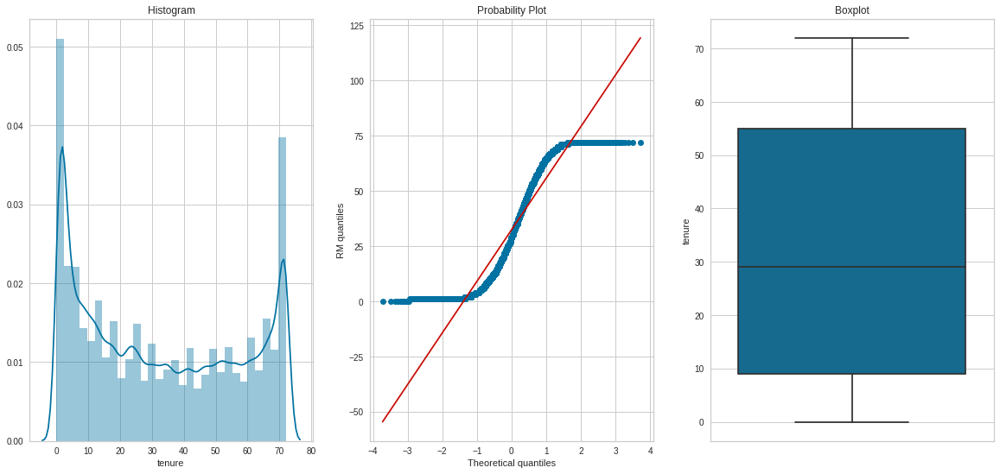

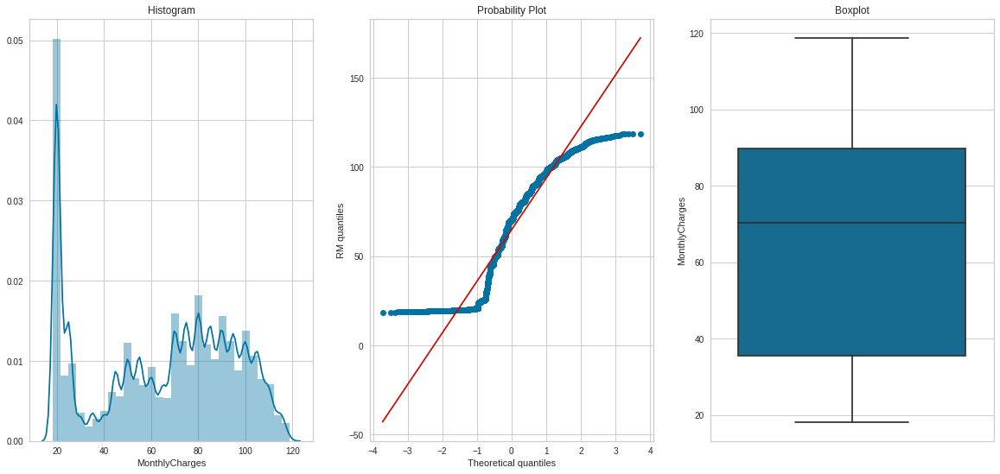

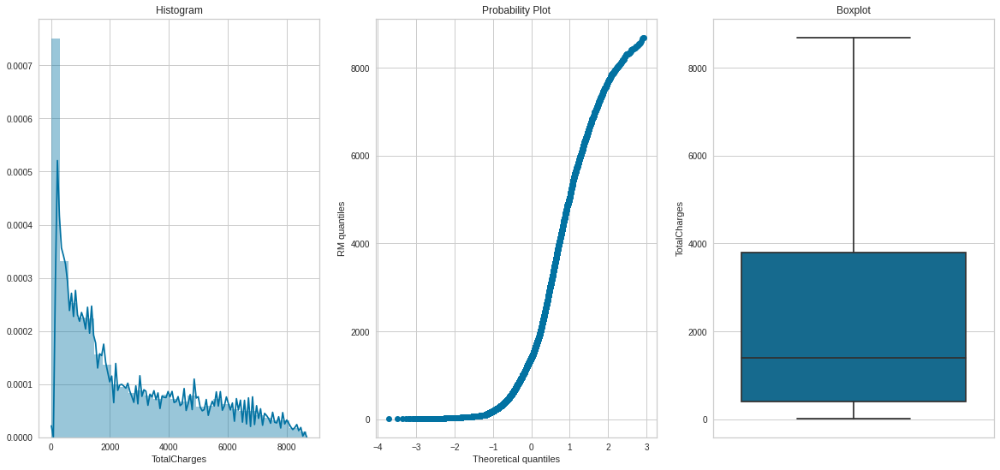

In [215]:
num_columns=df.select_dtypes(exclude=["object"]).columns
for i in num_columns:
    diagnostic_plots(df,i)


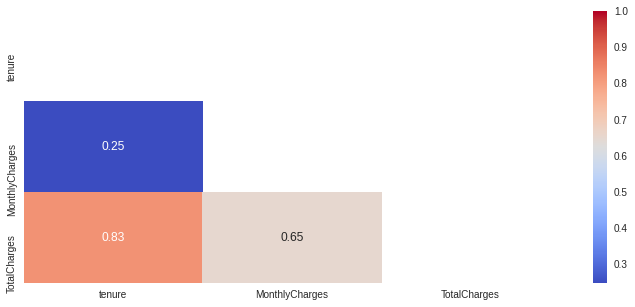

In [216]:
plt.figure(figsize=(12,5))
corr=df.corr().abs()
mask=np.zeros_like(corr,dtype=np.bool)
mask[np.triu_indices_from(mask)]=True
sns.heatmap(corr,annot=True,cmap="coolwarm",mask=mask);

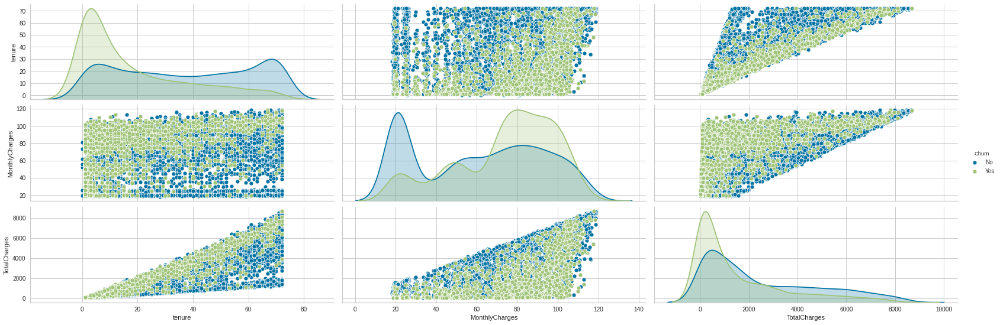

In [217]:
sns.pairplot(df,hue="Churn",aspect=3);

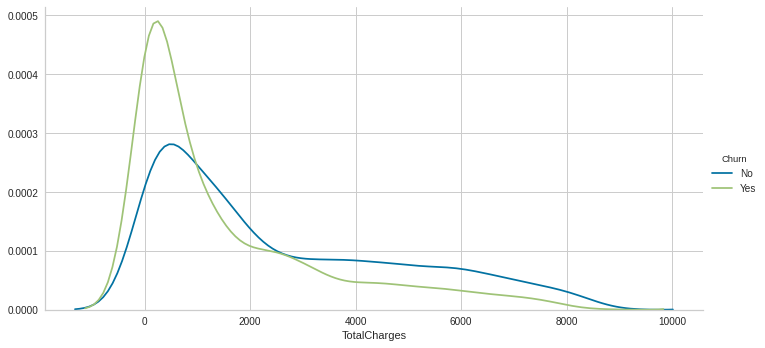

In [218]:
sns.FacetGrid(df,hue="Churn",height=5,aspect=2).map(sns.kdeplot,"TotalCharges",shade=False).add_legend();

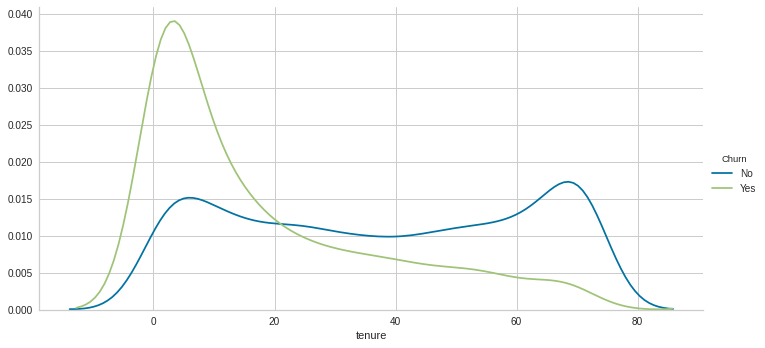

In [219]:
sns.FacetGrid(df,hue="Churn",height=5,aspect=2).map(sns.kdeplot,"tenure",shade=False).add_legend();

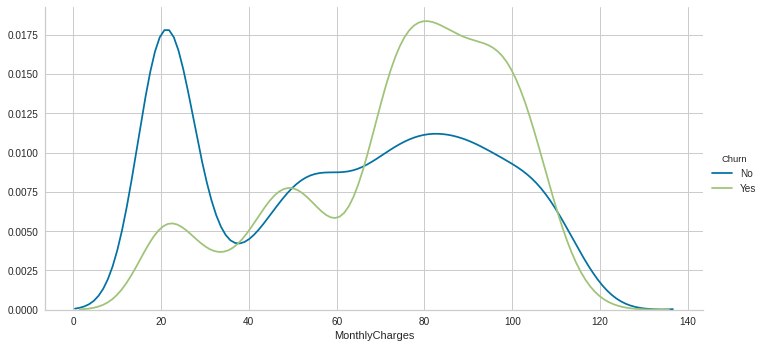

In [220]:
sns.FacetGrid(df,hue="Churn",height=5,aspect=2).map(sns.kdeplot,"MonthlyCharges",shade=False).add_legend();

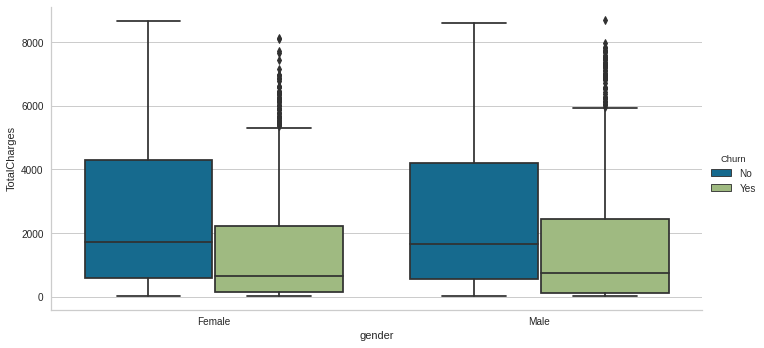

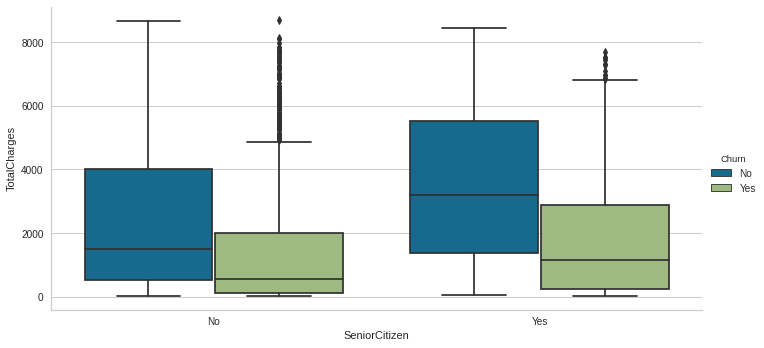

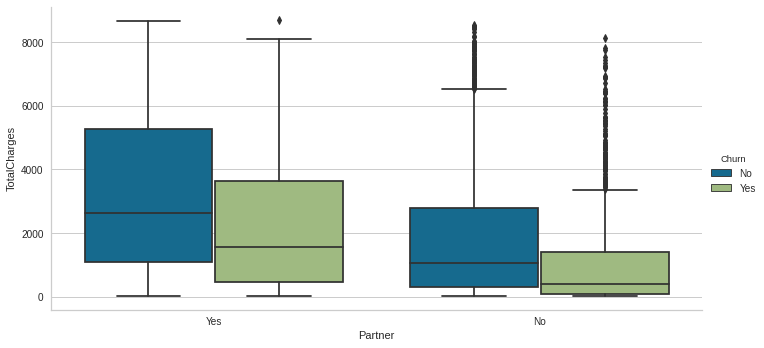

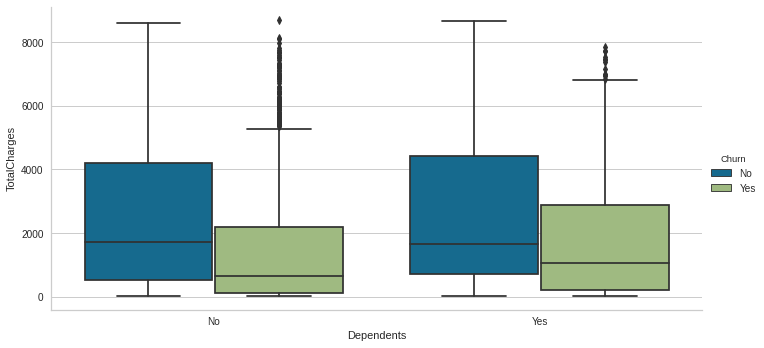

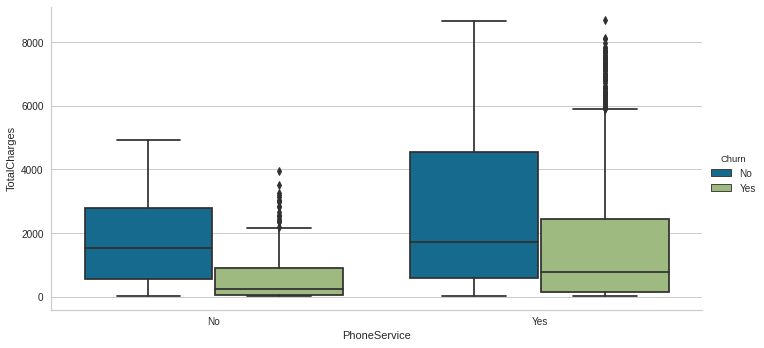

...

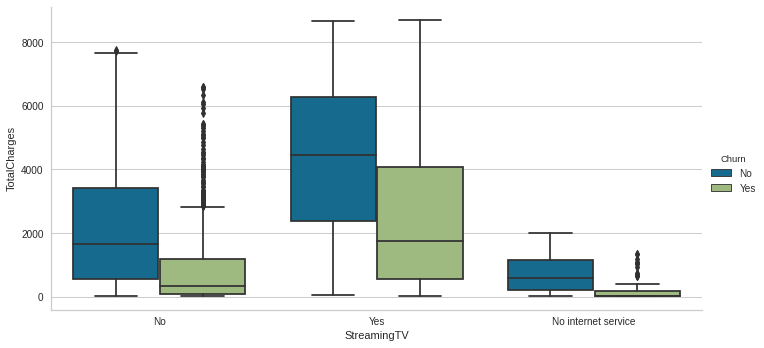

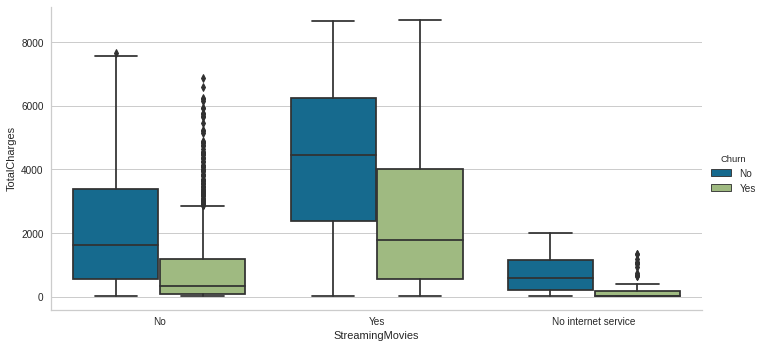

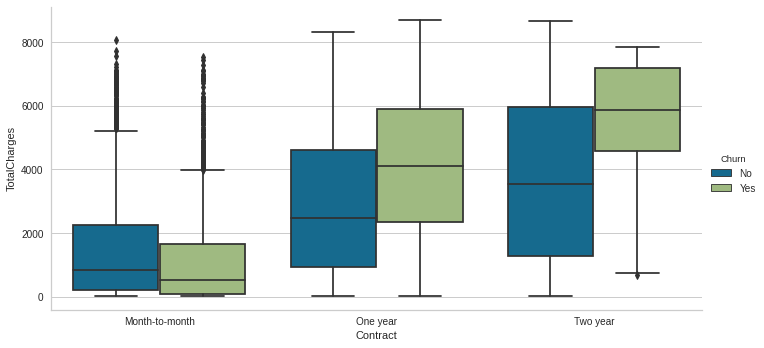

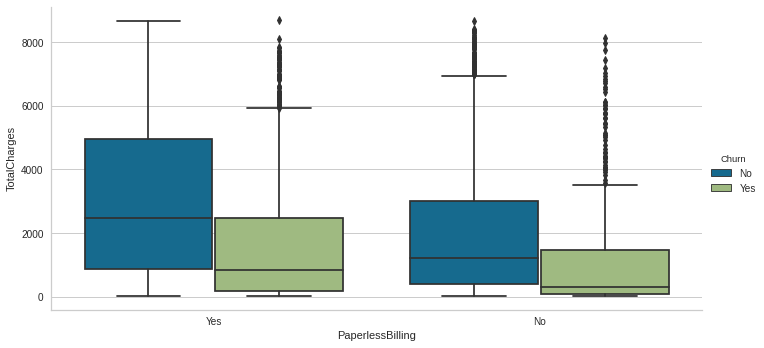

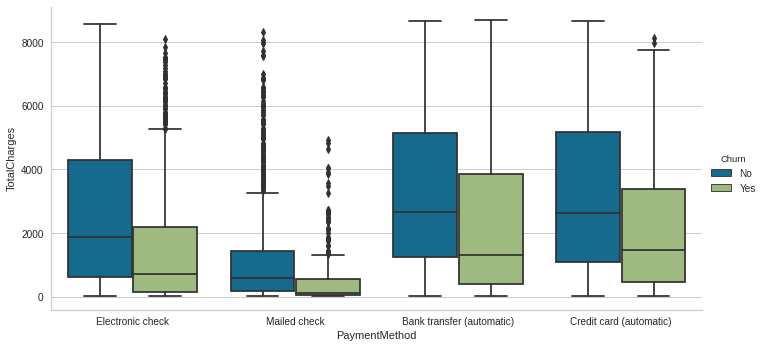

In [221]:
cat_columns=df.select_dtypes(include="object").columns[1:]
for i in cat_columns[:-1]:
    sns.catplot(x=i,y="TotalCharges",hue="Churn",data=df,kind="box",aspect=2);

In [222]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   object 
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


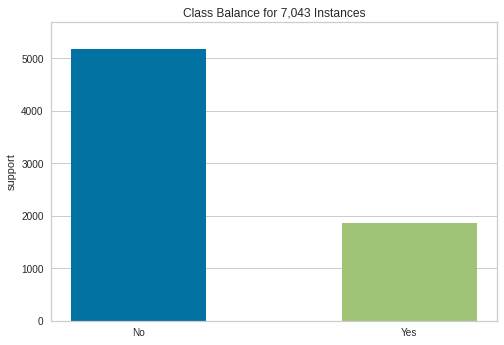

In [223]:
class_balance(df.iloc[:,-1]);

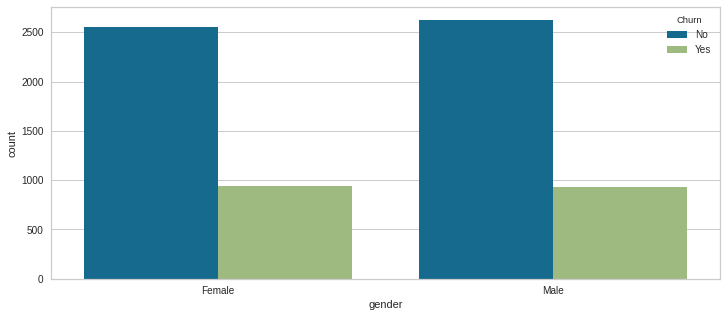

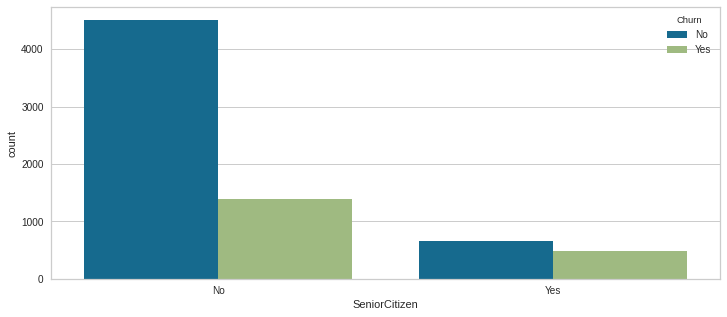

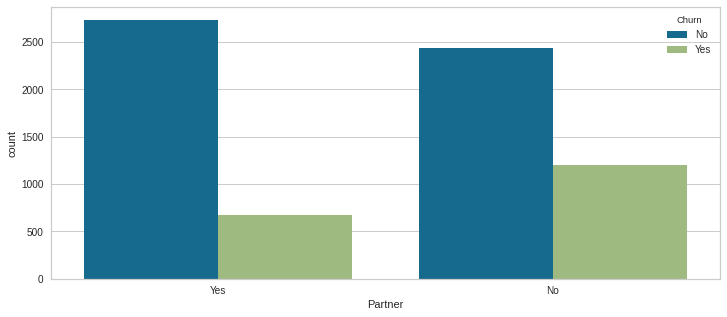

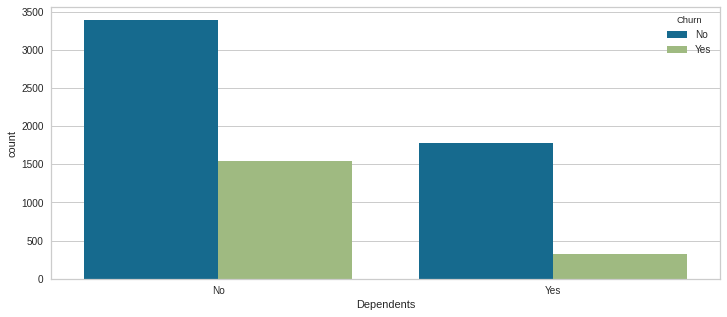

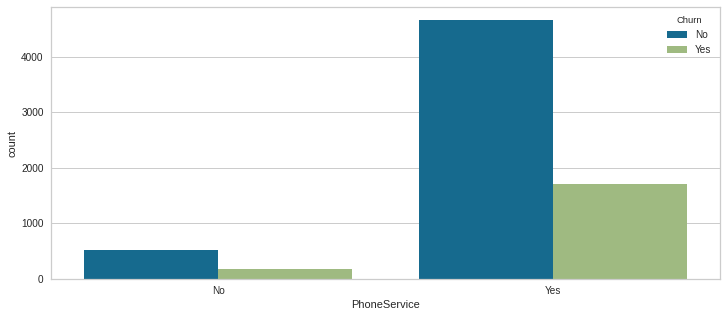

...

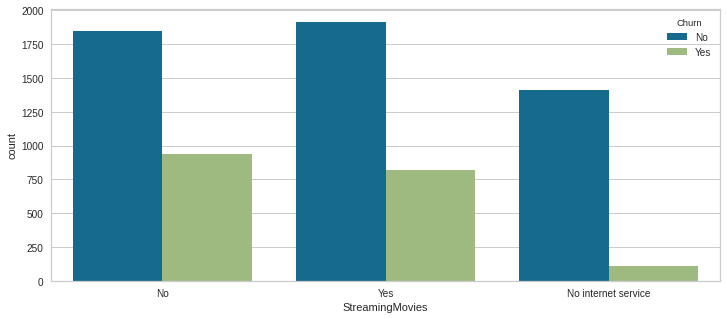

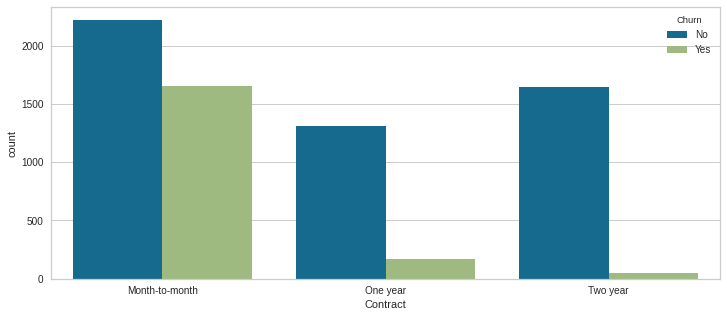

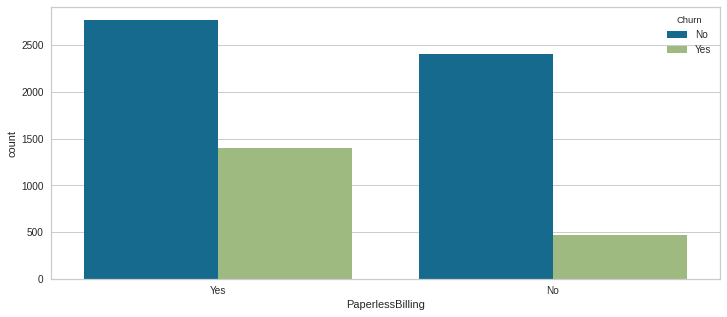

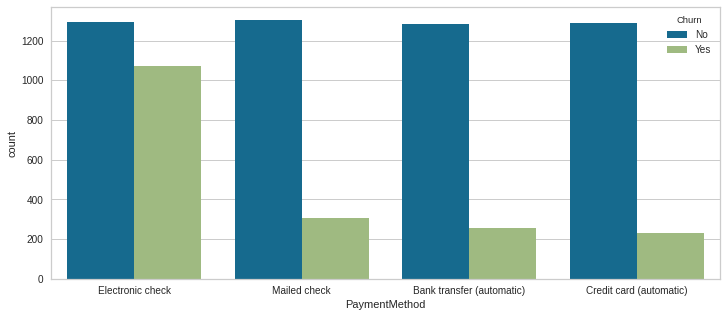

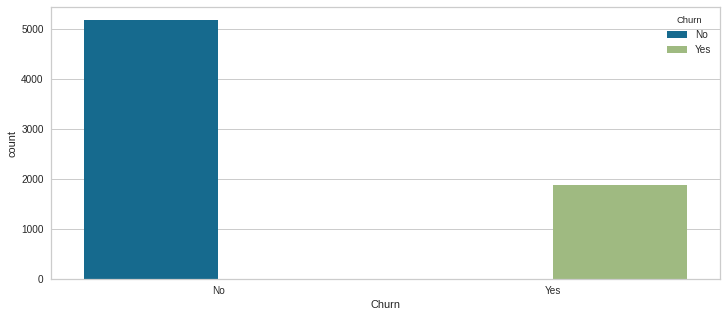

In [224]:

for i in cat_columns:
    plt.figure(figsize=(12,5));
    sns.countplot(df[i],hue="Churn",data=df)
    plt.show()

In [225]:
df.isnull().sum()/(len(df))

customerID          0.000000
gender              0.000000
SeniorCitizen       0.000000
Partner             0.000000
Dependents          0.000000
tenure              0.000000
PhoneService        0.000000
MultipleLines       0.000000
InternetService     0.000000
OnlineSecurity      0.000000
OnlineBackup        0.000000
DeviceProtection    0.000000
TechSupport         0.000000
StreamingTV         0.000000
StreamingMovies     0.000000
Contract            0.000000
PaperlessBilling    0.000000
PaymentMethod       0.000000
MonthlyCharges      0.000000
TotalCharges        0.001562
Churn               0.000000
dtype: float64

In [226]:
df[pd.isnull(df["TotalCharges"])]

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,No,Yes,Yes,0,No,No phone service,DSL,Yes,No,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,NaN,No
753,3115-CZMZD,Male,No,No,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,NaN,No
936,5709-LVOEQ,Female,No,Yes,Yes,0,Yes,No,DSL,Yes,Yes,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,NaN,No
1082,4367-NUYAO,Male,No,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,NaN,No
1340,1371-DWPAZ,Female,No,Yes,Yes,0,No,No phone service,DSL,Yes,Yes,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,NaN,No
3331,7644-OMVMY,Male,No,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,NaN,No
3826,3213-VVOLG,Male,No,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,NaN,No
4380,2520-SGTTA,Female,No,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,NaN,No
5218,2923-ARZLG,Male,No,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,NaN,No
6670,4075-WKNIU,Female,No,Yes,Yes,0,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,NaN,No


In [227]:
df.TotalCharges.fillna(df.TotalCharges.median(),inplace=True)

In [228]:
df.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [229]:
df=df.drop(columns=["customerID"],axis=1)

In [230]:
df_coded=pd.get_dummies(df,drop_first=True)

In [231]:
X=df_coded.iloc[:,:-1]
y=df_coded.iloc[:,-1]

# TRAIN TEST SPLIT

In [232]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.25, 
                                                    random_state=42)

In [233]:
X_train.shape,y_train.shape,X_test.shape,y_test.shape

((5282, 30), (5282,), (1761, 30), (1761,))

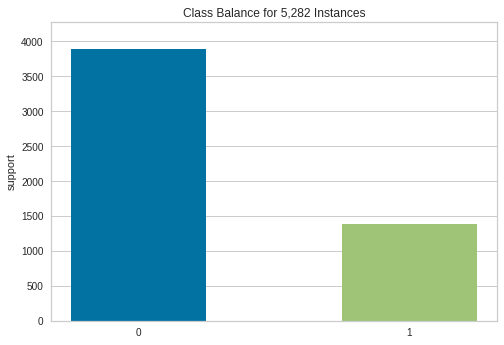

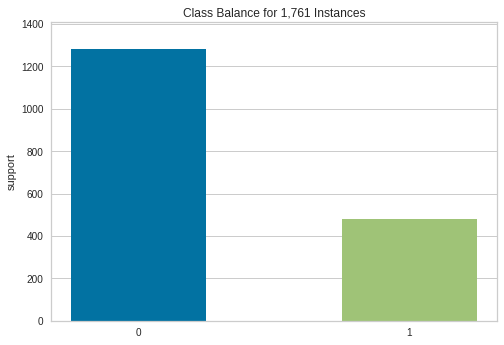

In [234]:

class_balance(y_train);
class_balance(y_test);

# MODELLING

In [235]:
models = []
models.append(('LR', LogisticRegression(random_state = 12345)))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier(random_state = 12345)))
models.append(('RF', RandomForestClassifier(random_state = 12345)))
#models.append(('SVC', SVC(gamma='auto', random_state = 12345)))
models.append(("LightGBM", LGBMClassifier(random_state = 12345)))
models.append(("XGBoost", XGBClassifier(random_state = 12345)))
models.append(("GBM", GradientBoostingClassifier(random_state = 12345)))
models.append(("HGBoost", HistGradientBoostingClassifier(random_state = 12345)))
models.append(("Adaboost", AdaBoostClassifier(random_state = 12345)))
models.append(("Gaussian", GaussianNB()))
#models.append(("Discriminant", QuadraticDiscriminantAnalysis()))
#models.append(("Catboost", CatBoostClassifier(random_state=12345)))

In [236]:
results = []
names = []

In [237]:
for name, model in models:
    
        kfold = KFold(n_splits = 10, random_state = 12345)
        cv_results = cross_val_score(model, X, y, cv = 10, scoring= "accuracy")
        results.append(cv_results)
        names.append(name)
        msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
        print(msg)
        
        


LR: 0.803921 (0.009294)
KNN: 0.762883 (0.012181)
CART: 0.729375 (0.016104)
RF: 0.795540 (0.017376)
LightGBM: 0.797812 (0.014947)
XGBoost: 0.783188 (0.017888)
GBM: 0.804486 (0.013231)
HGBoost: 0.798520 (0.015253)
Adaboost: 0.805763 (0.012660)
Gaussian: 0.661790 (0.019868)


In [238]:


def visualize_result(model):
    print("*"*5 + str(model) + "*"*5)
    fig, axes = plt.subplots(2, 2,figsize=(20,10))

    model = model;
    model.fit(X_train,y_train)
    y_pred=model.predict(X_test)
    print("Accuracy Score :",accuracy_score(y_test,y_pred))
    
    
    visualgrid = [
        ConfusionMatrix(model, ax=axes[0][0],cmap="YlGn"),
        PrecisionRecallCurve(model,ax=axes[0][1]),  
        #FeatureImportances(model,ax=axes[0][0]),        
        ClassificationReport(model, ax=axes[1][0]),
        ROCAUC(model, ax=axes[1][1])
    ]

    for viz in visualgrid:
        
        viz.fit(X_train, y_train)
        viz.score(X_test, y_test)
        viz.finalize()


    plt.show()
    

*****LogisticRegression(random_state=12345)*****
Accuracy Score : 0.8052243043725156


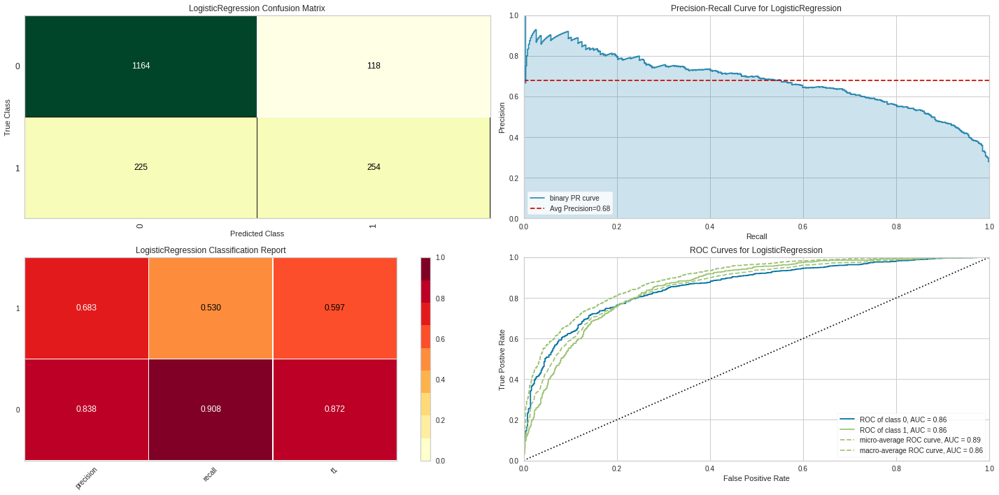

*****KNeighborsClassifier()*****
Accuracy Score : 0.768313458262351


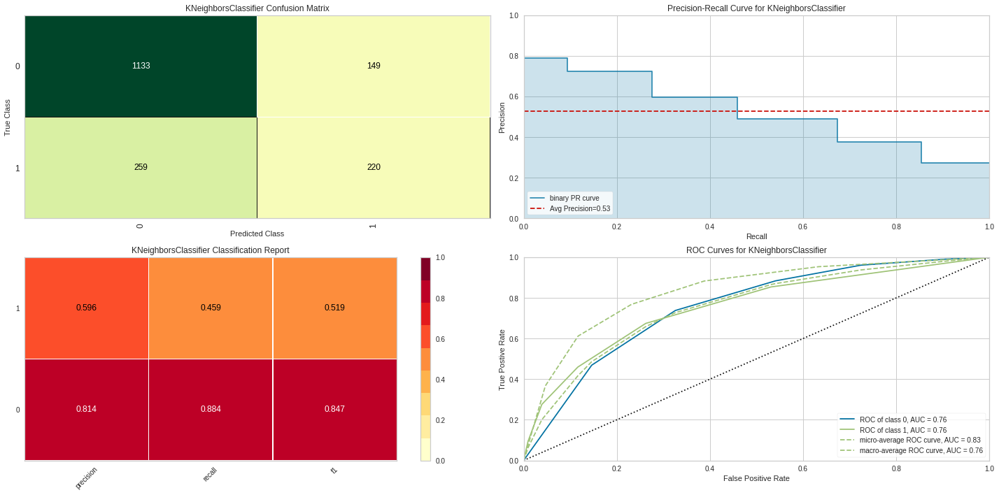

*****DecisionTreeClassifier(random_state=12345)*****
Accuracy Score : 0.7183418512208972


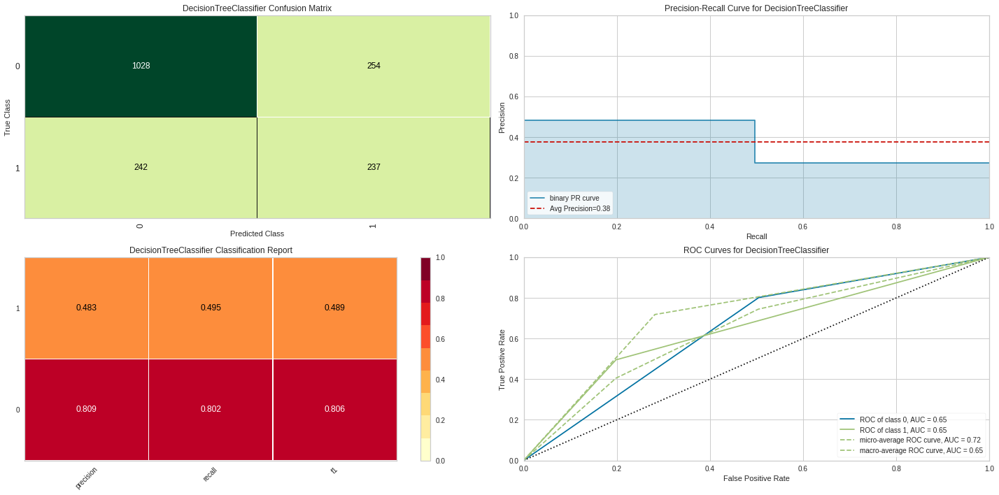

*****RandomForestClassifier(random_state=12345)*****
Accuracy Score : 0.794434980124929


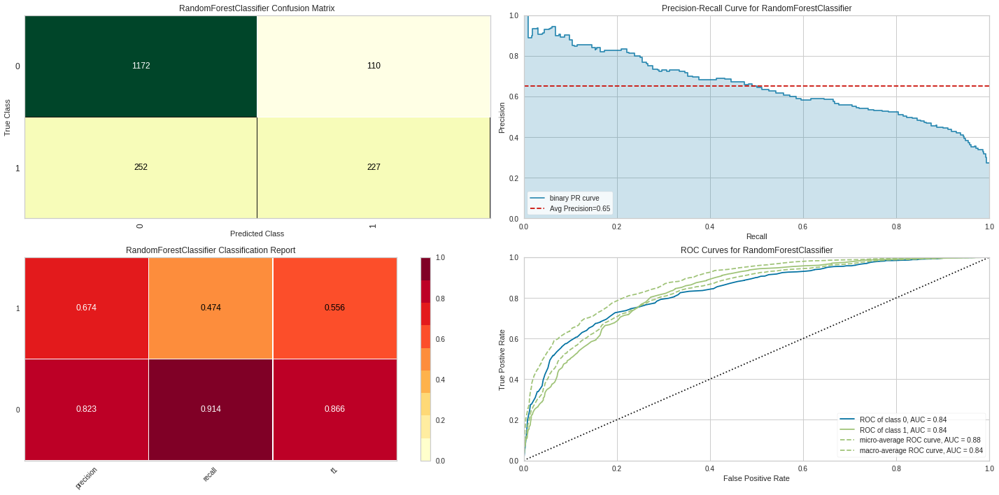

*****LGBMClassifier(random_state=12345)*****
Accuracy Score : 0.7984099943214082


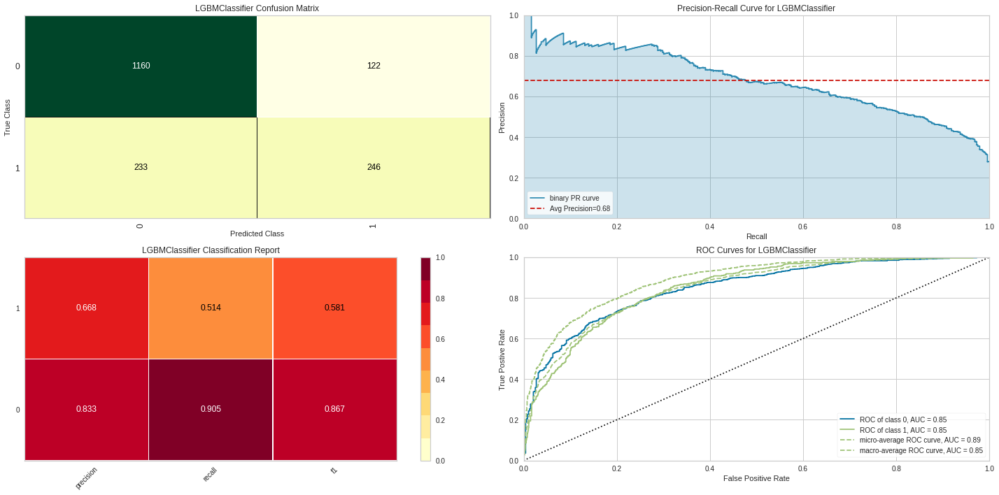

*****XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None, gamma=None,
              gpu_id=None, importance_type='gain', interaction_constraints=None,
              learning_rate=None, max_delta_step=None, max_depth=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              random_state=12345, reg_alpha=None, reg_lambda=None,
              scale_pos_weight=None, subsample=None, tree_method=None,
              validate_parameters=None, verbosity=None)*****
Accuracy Score : 0.7904599659284497


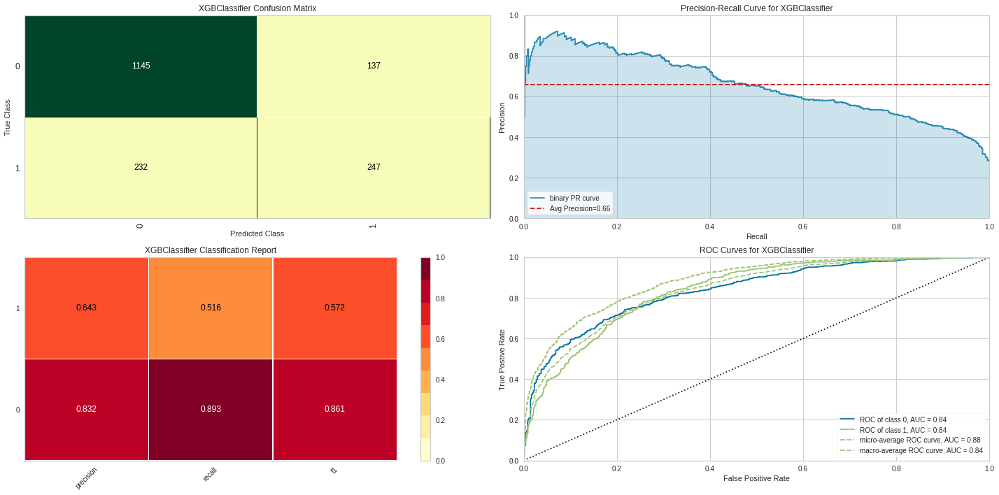

*****GradientBoostingClassifier(random_state=12345)*****
Accuracy Score : 0.7984099943214082


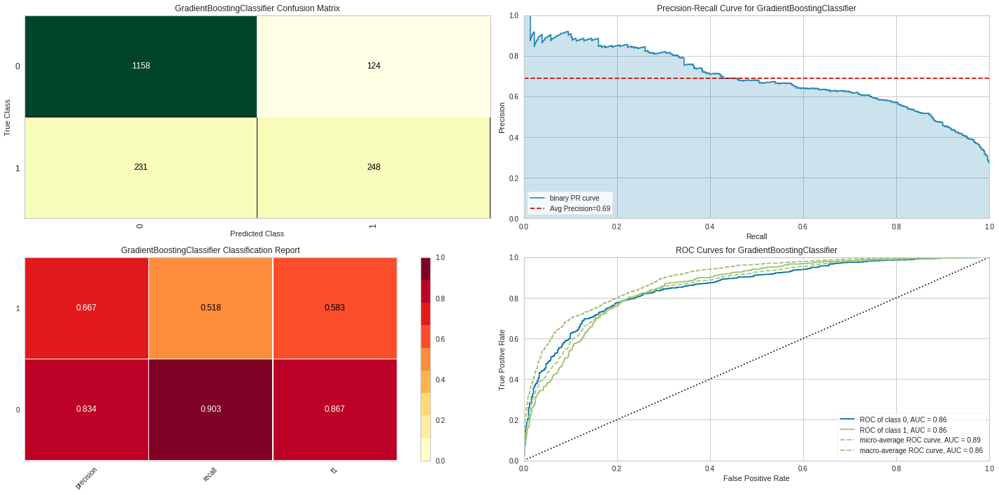

*****HistGradientBoostingClassifier(random_state=12345)*****
Accuracy Score : 0.7915956842703009


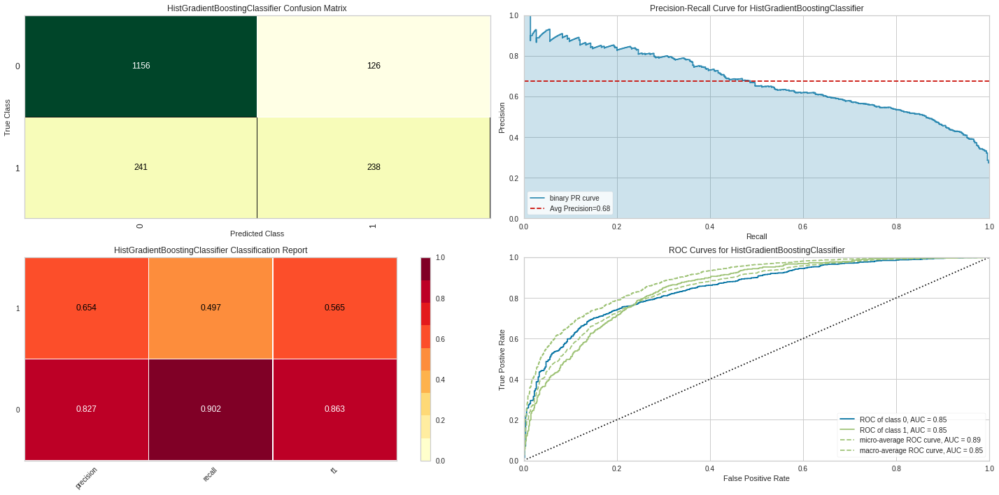

*****AdaBoostClassifier(random_state=12345)*****
Accuracy Score : 0.7995457126632595


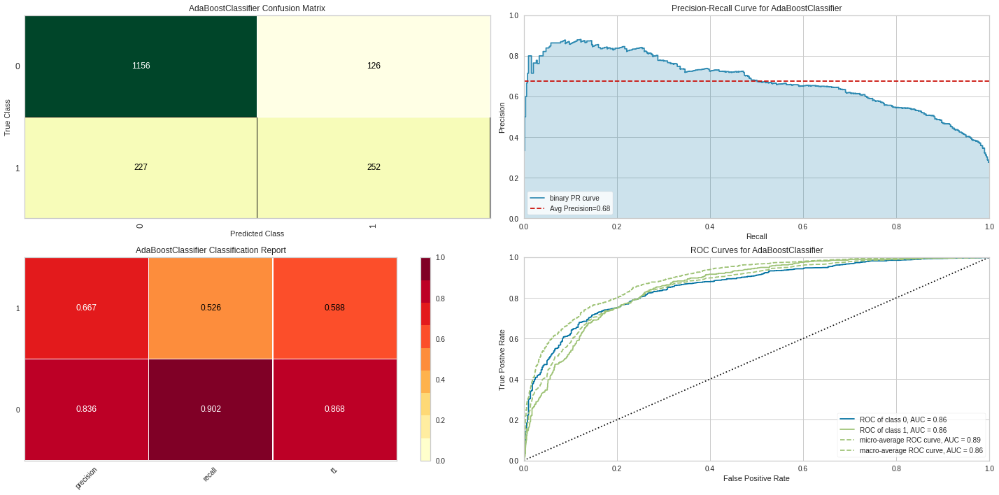

*****GaussianNB()*****
Accuracy Score : 0.6672345258375922


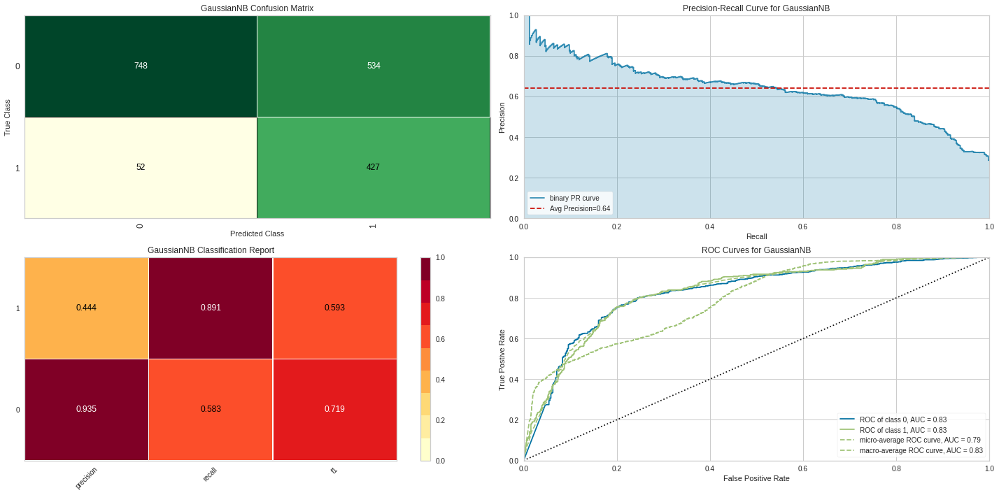

In [239]:
for i in range(len(models)):    
    visualize_result(models[i][1])

# UNDERSAMPLING

## NearMiss

In [240]:
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.25,random_state=42)
nm = NearMiss()
X_train, y_train = nm.fit_sample(X_train, y_train)
y_train = y_train.astype(int)

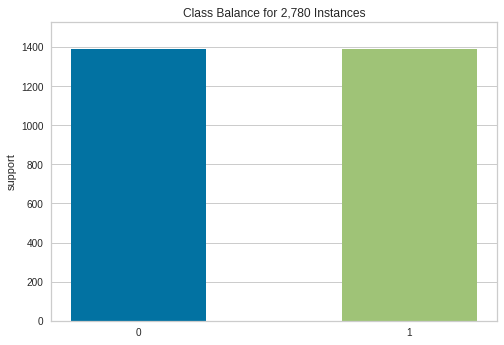

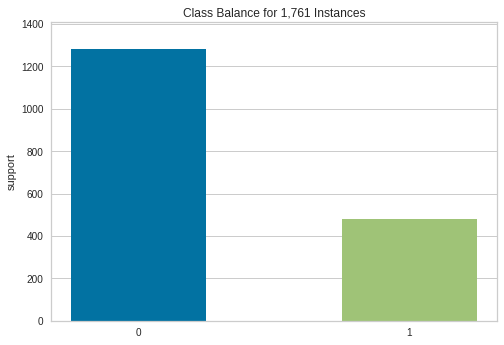

In [241]:
class_balance(y_train);
class_balance(y_test);

*****LogisticRegression(random_state=12345)*****
Accuracy Score : 0.6978989210675752


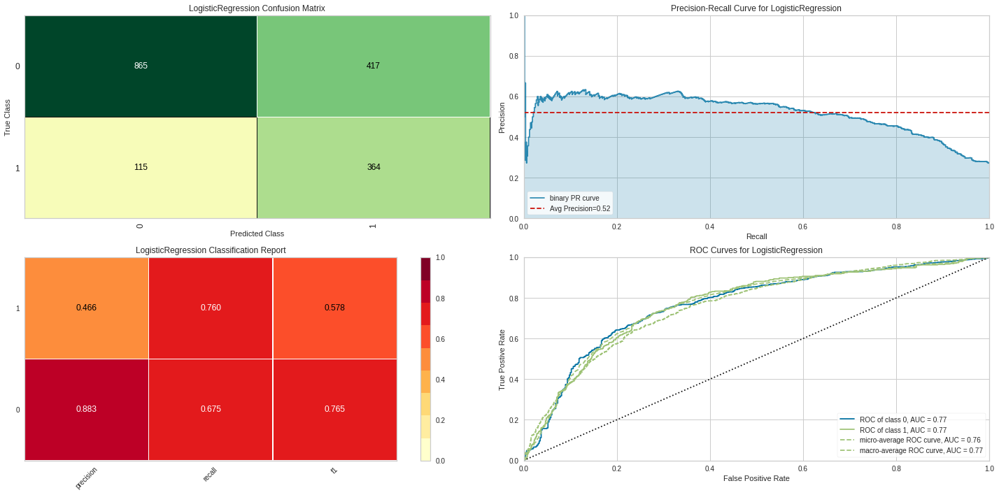

*****KNeighborsClassifier()*****
Accuracy Score : 0.454855195911414


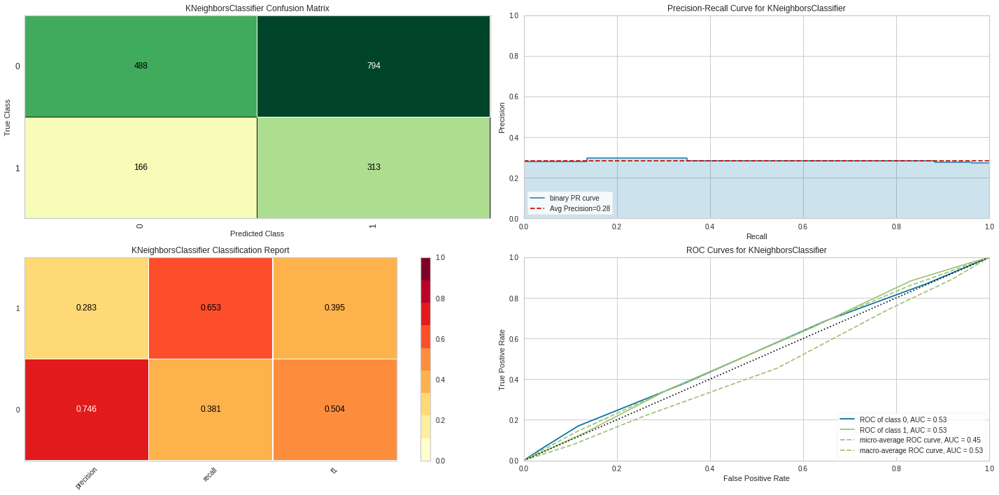

*****DecisionTreeClassifier(random_state=12345)*****
Accuracy Score : 0.5036910846110164


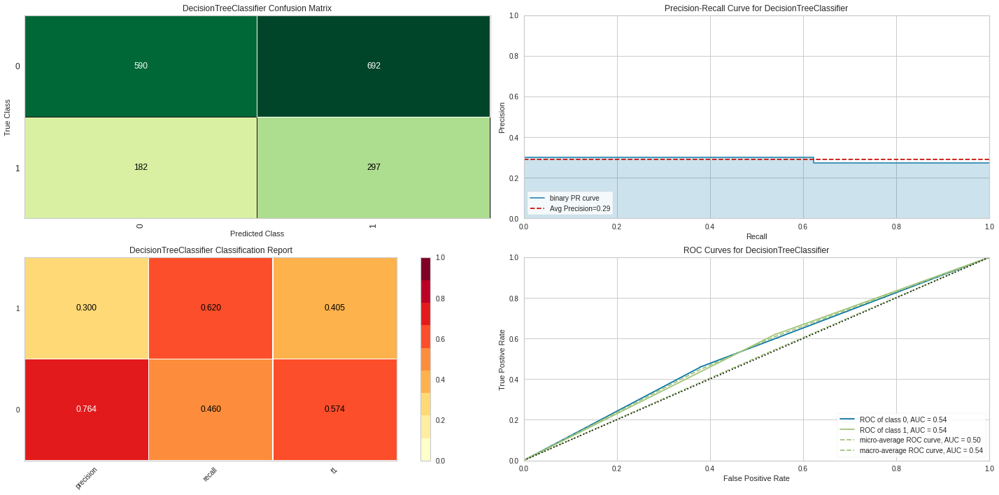

*****RandomForestClassifier(random_state=12345)*****
Accuracy Score : 0.5593412833617263


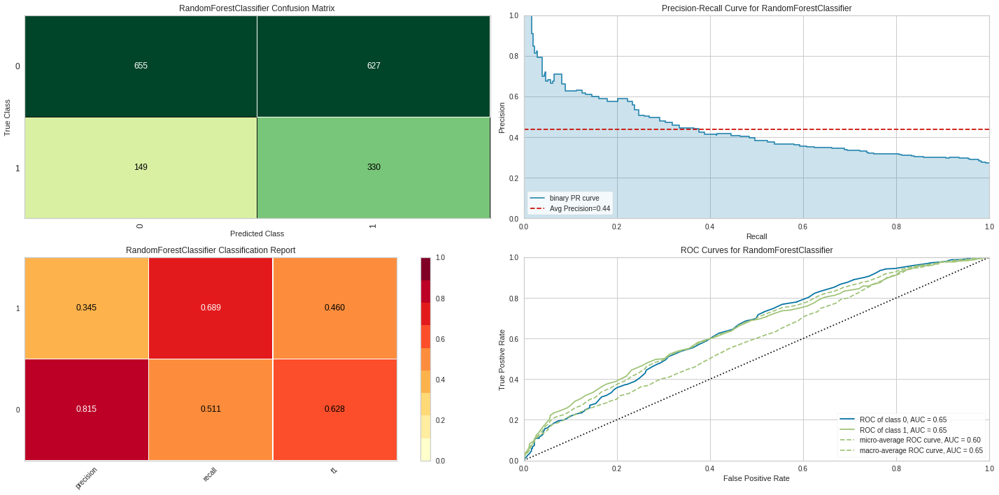

*****LGBMClassifier(random_state=12345)*****
Accuracy Score : 0.521862578080636


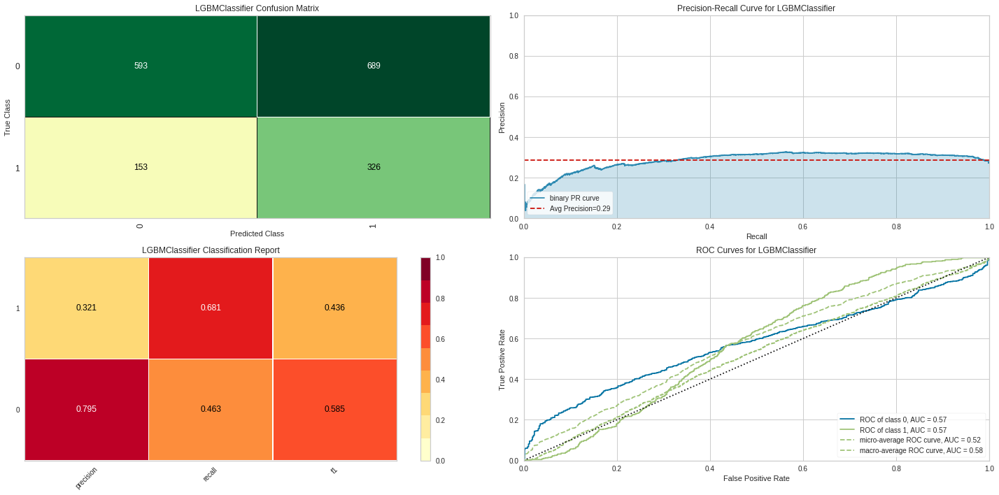

*****XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              random_state=12345, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)*****
Accuracy Score : 0.5070982396365701


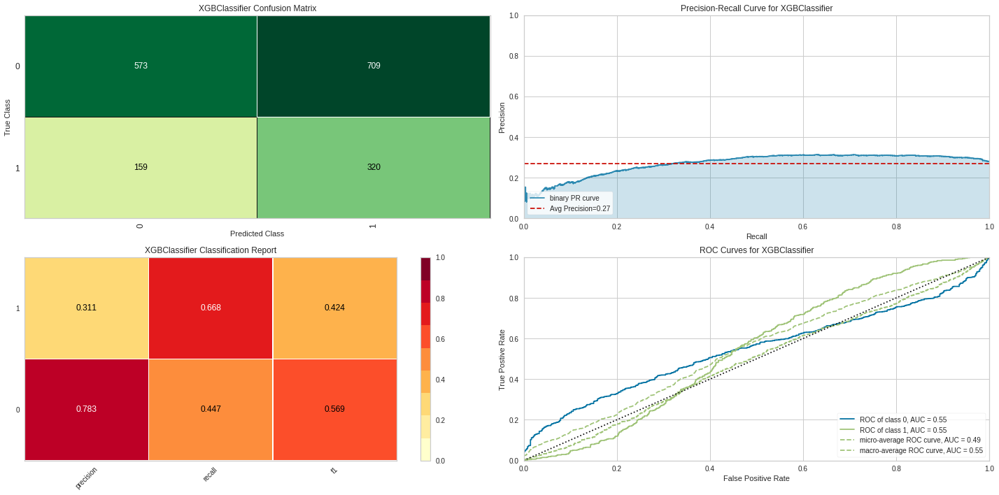

*****GradientBoostingClassifier(random_state=12345)*****
Accuracy Score : 0.5224304372515616


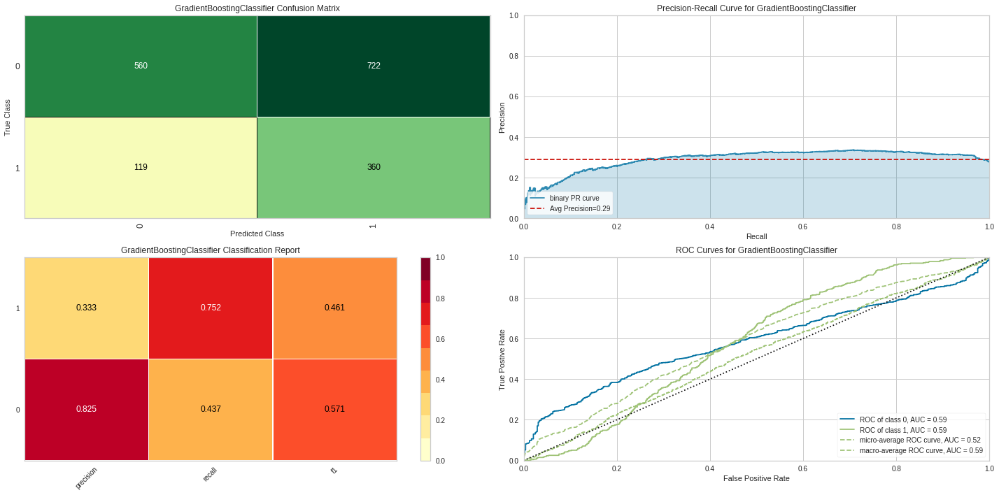

*****HistGradientBoostingClassifier(random_state=12345)*****
Accuracy Score : 0.5127768313458262


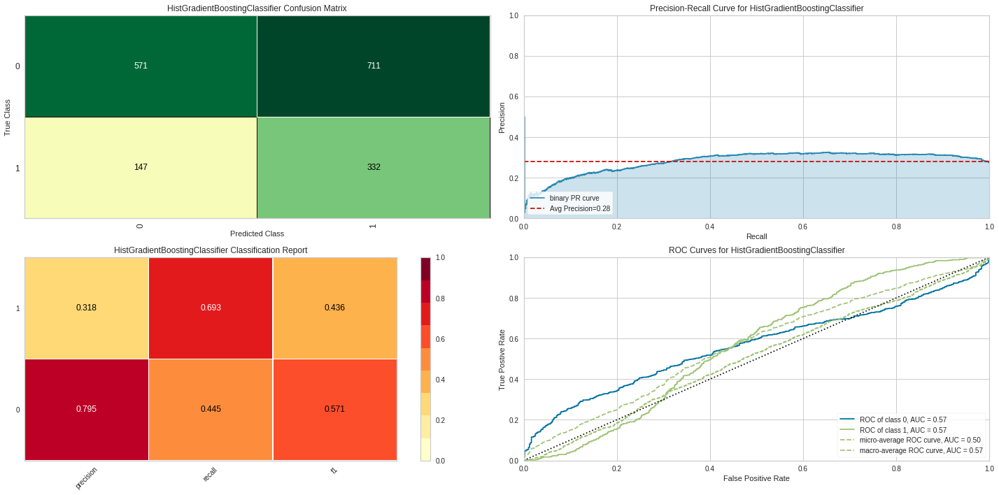

*****AdaBoostClassifier(random_state=12345)*****
Accuracy Score : 0.6047700170357752


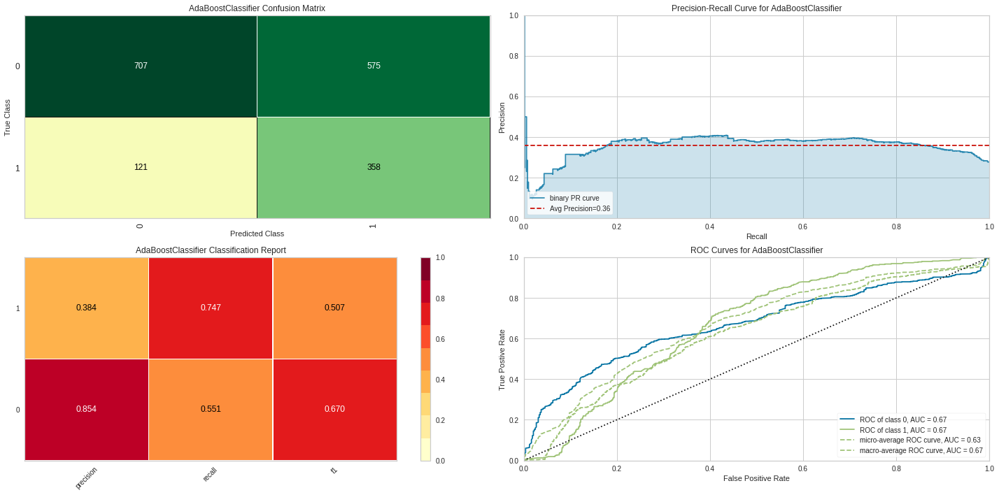

*****GaussianNB()*****
Accuracy Score : 0.5820556501987507


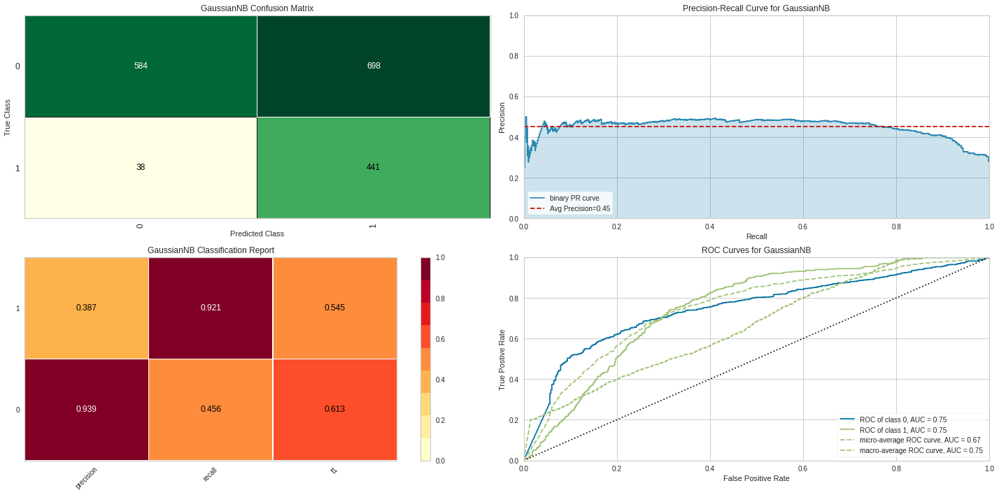

In [242]:
for i in range(len(models)):    
    visualize_result(models[i][1])

## RandomUnderSampler

*****LogisticRegression(random_state=12345)*****
Accuracy Score : 0.7654741624077229


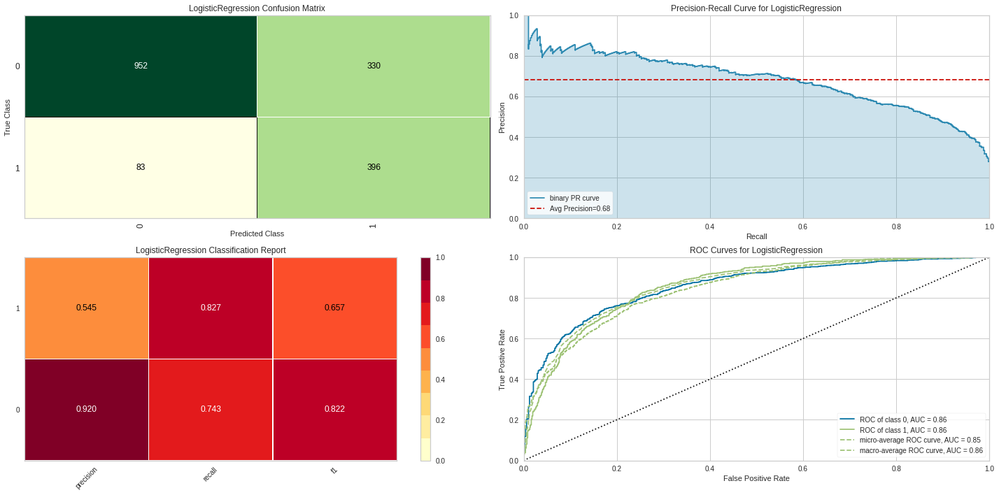

*****KNeighborsClassifier()*****
Accuracy Score : 0.7126632595116411


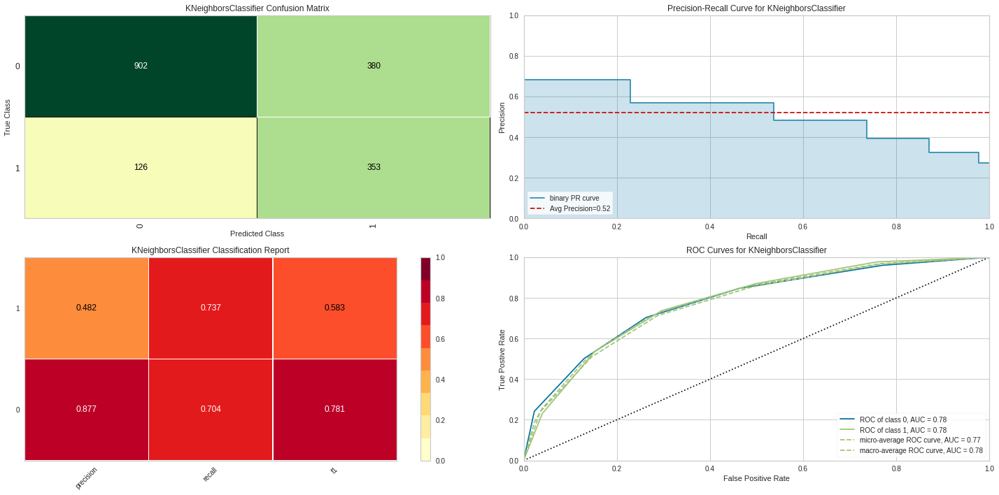

*****DecisionTreeClassifier(random_state=12345)*****
Accuracy Score : 0.6996024985803521


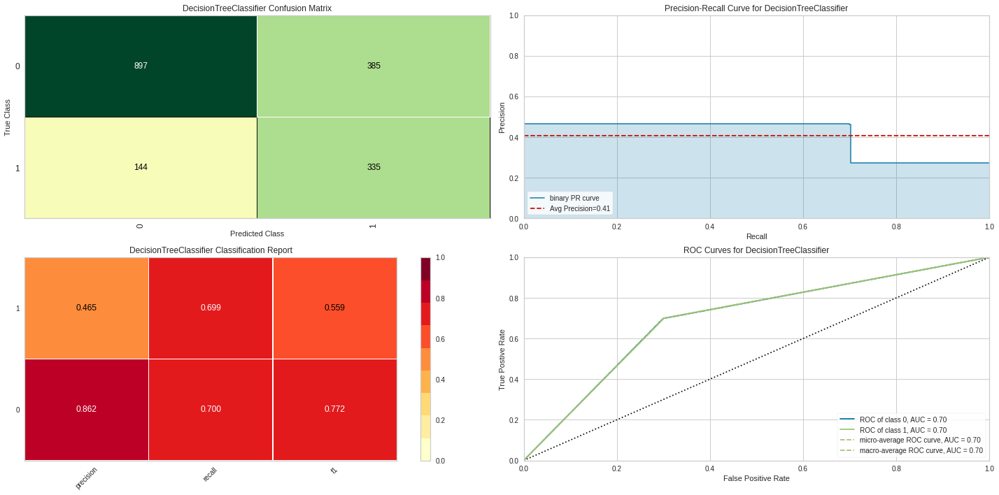

*****RandomForestClassifier(random_state=12345)*****
Accuracy Score : 0.7569562748438388


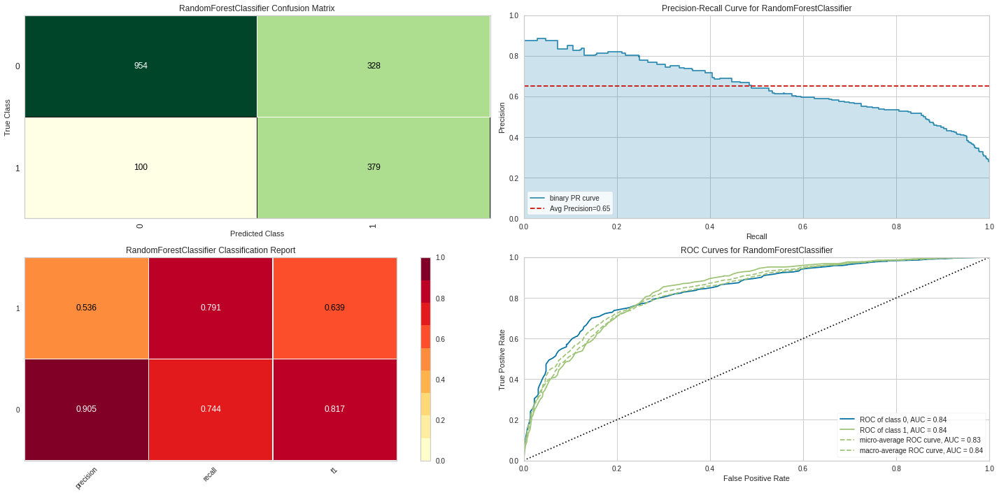

*****LGBMClassifier(random_state=12345)*****
Accuracy Score : 0.7563884156729132


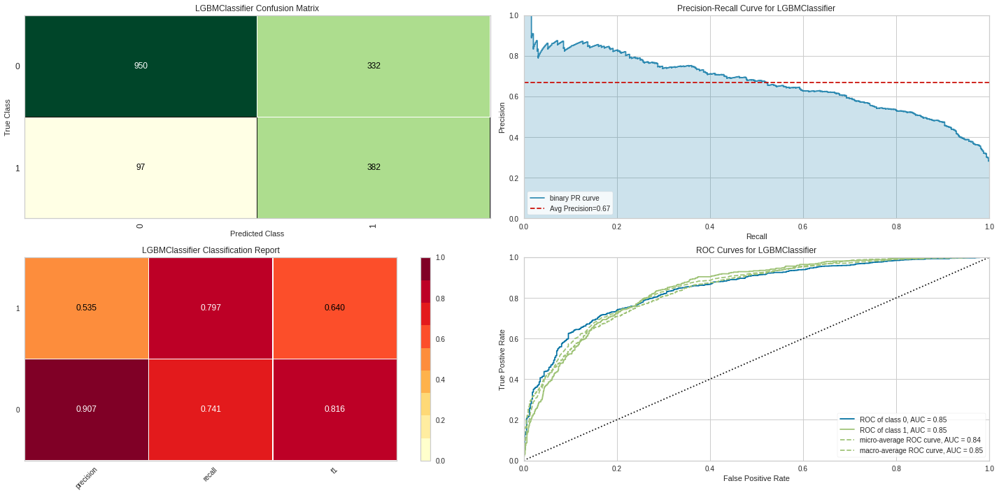

*****XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              random_state=12345, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)*****
Accuracy Score : 0.7399204997160704


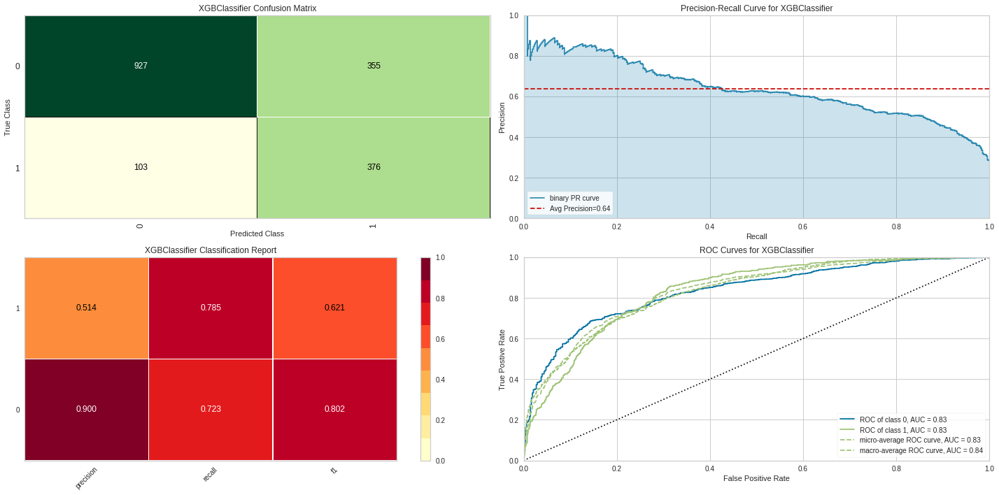

*****GradientBoostingClassifier(random_state=12345)*****
Accuracy Score : 0.7597955706984668


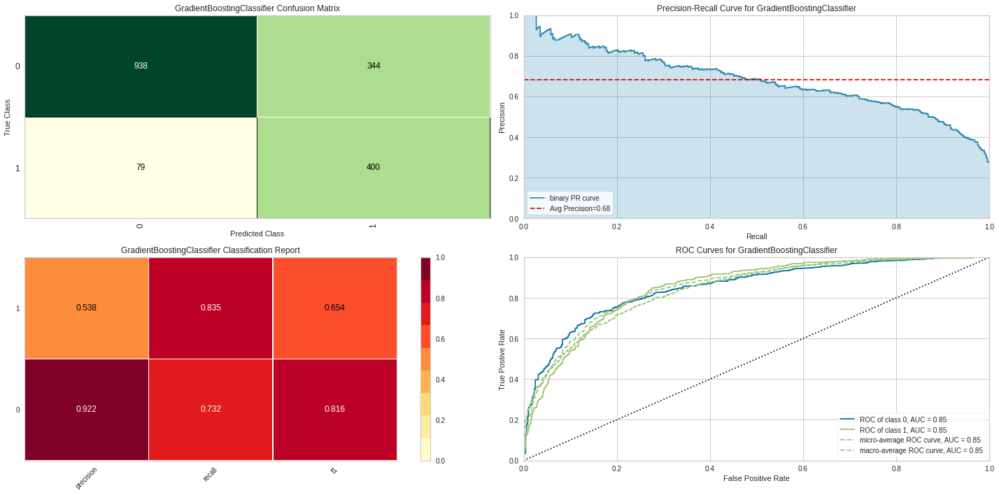

*****HistGradientBoostingClassifier(random_state=12345)*****
Accuracy Score : 0.7484383872799546


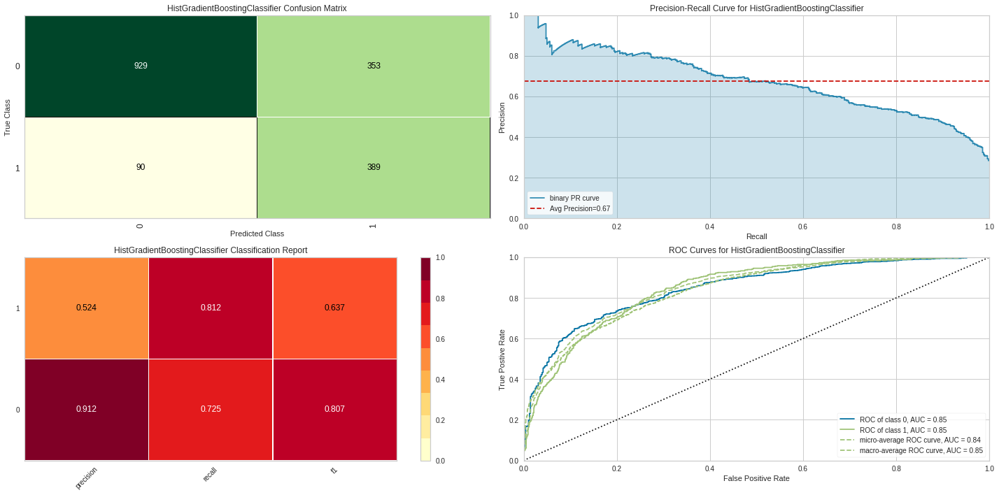

*****AdaBoostClassifier(random_state=12345)*****
Accuracy Score : 0.7484383872799546


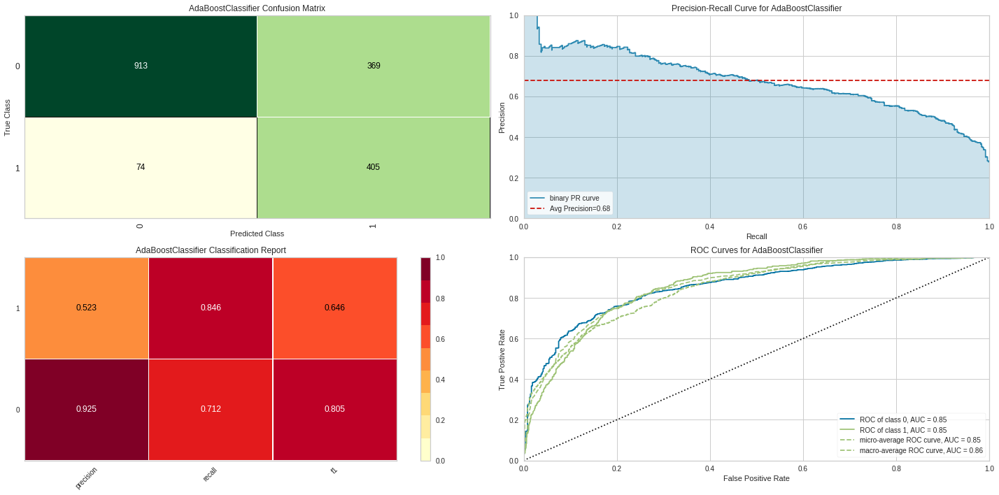

*****GaussianNB()*****
Accuracy Score : 0.6490630323679727


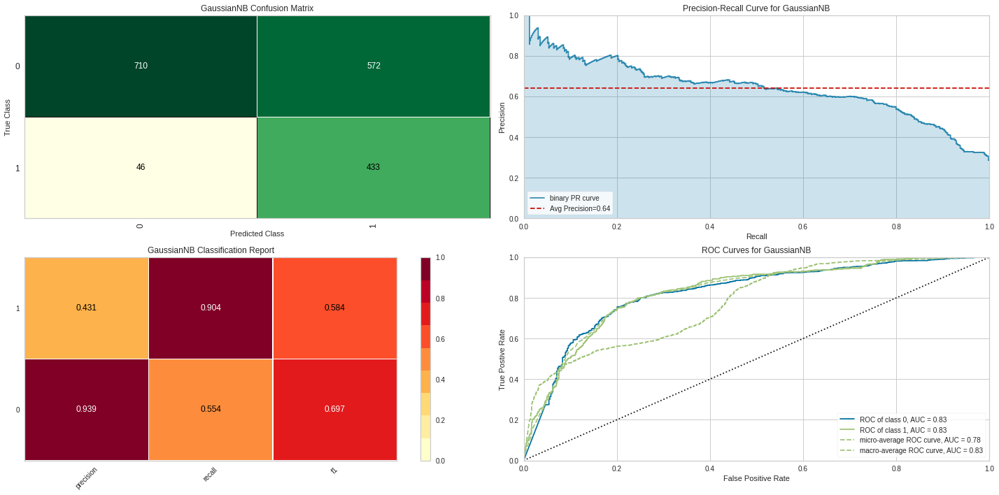

In [243]:
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.25,random_state=42)
rus = RandomUnderSampler(random_state=42)
X_train,y_train = rus.fit_resample(X_train, y_train)
for i in range(len(models)):    
    visualize_result(models[i][1])

# OVERSAMPLING

## SMOTE

In [244]:
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.25,random_state=42)
smt = SMOTE()
X_train, y_train = smt.fit_sample(X_train, y_train)
y_train = y_train.astype(int)

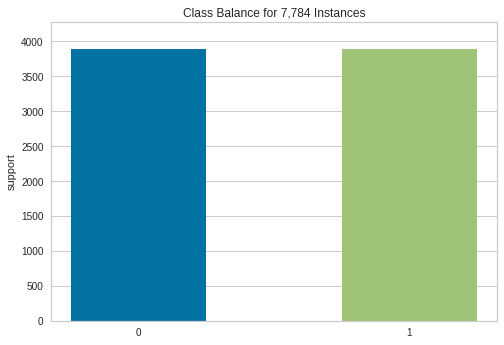

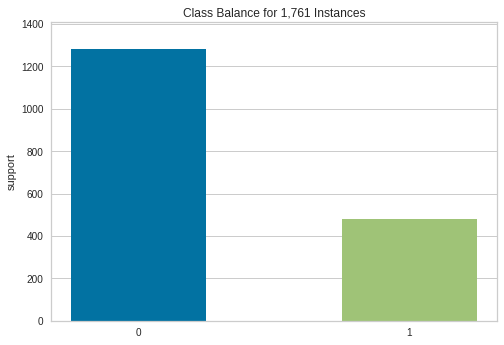

In [245]:
class_balance(y_train);
class_balance(y_test);

*****LogisticRegression(random_state=12345)*****
Accuracy Score : 0.7694491766042022


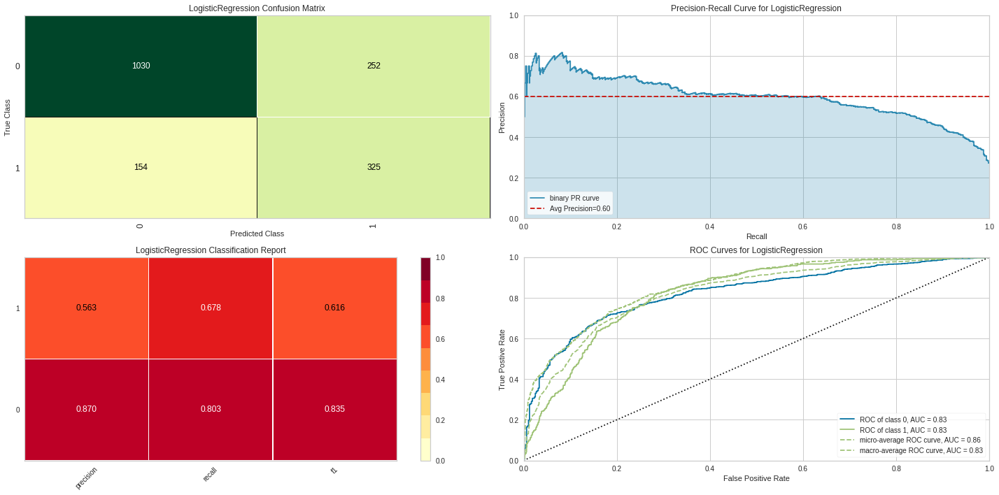

*****KNeighborsClassifier()*****
Accuracy Score : 0.7058489494605338


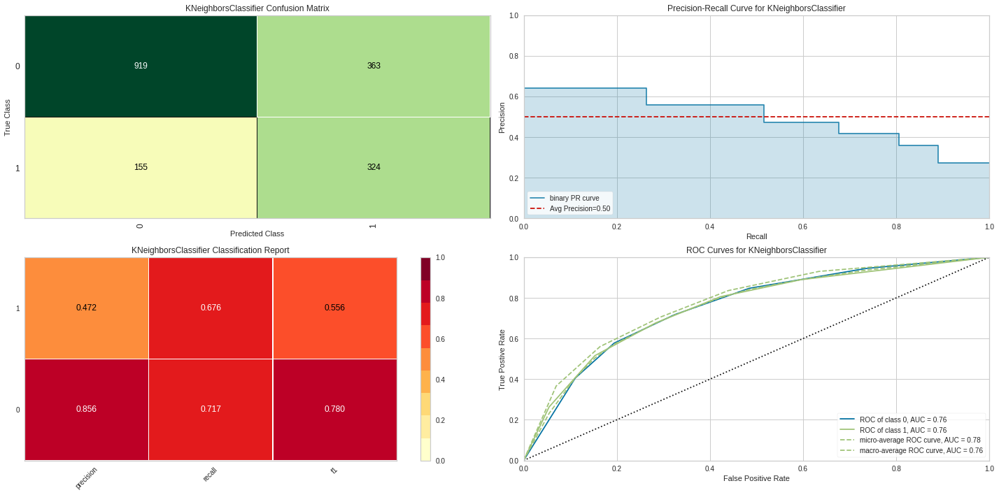

*****DecisionTreeClassifier(random_state=12345)*****
Accuracy Score : 0.720045428733674


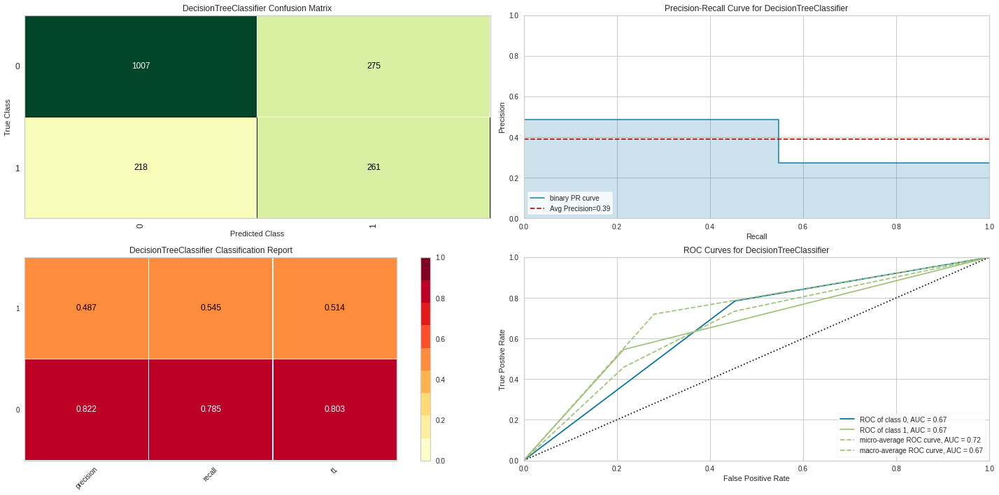

*****RandomForestClassifier(random_state=12345)*****
Accuracy Score : 0.7666098807495741


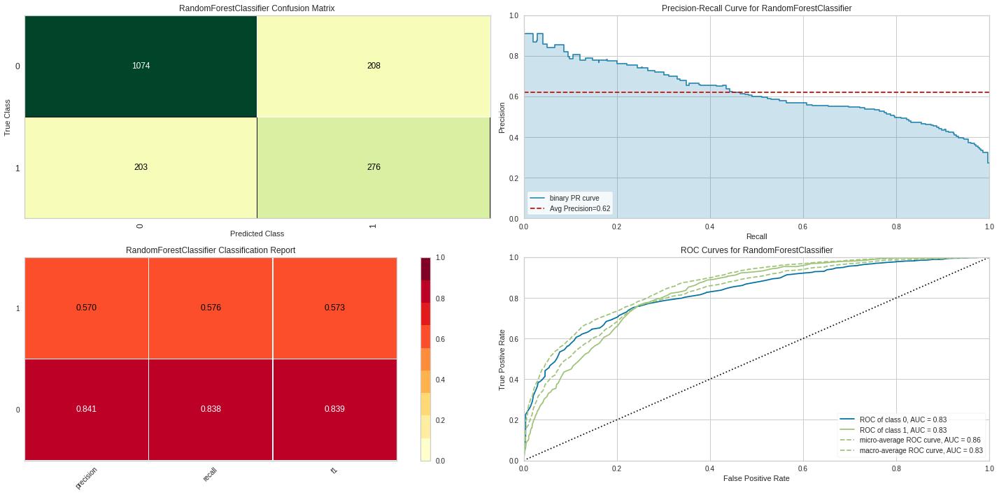

*****LGBMClassifier(random_state=12345)*****
Accuracy Score : 0.7739920499716071


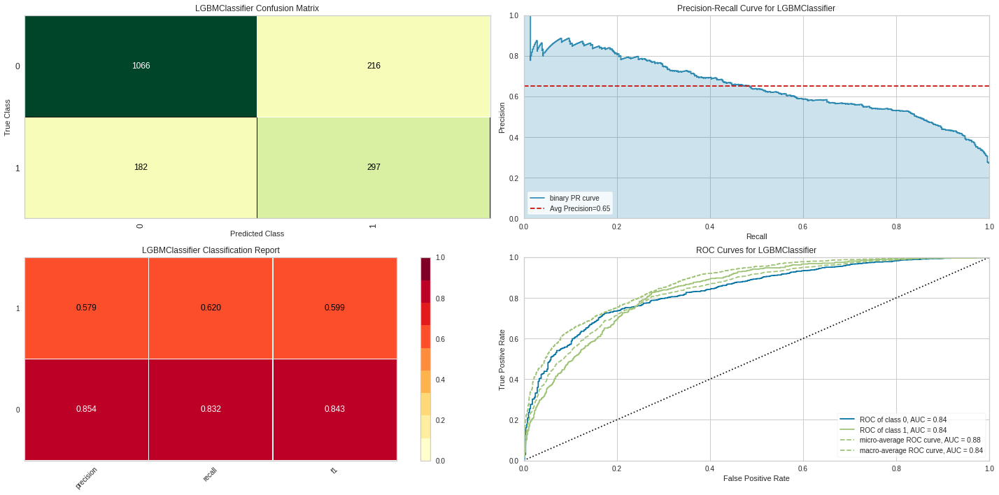

*****XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              random_state=12345, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)*****
Accuracy Score : 0.7739920499716071


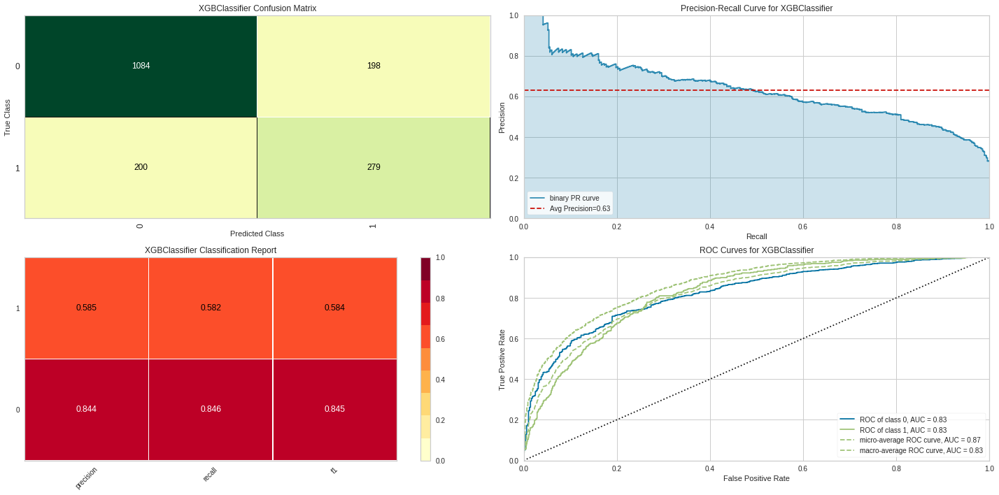

*****GradientBoostingClassifier(random_state=12345)*****
Accuracy Score : 0.7802385008517888


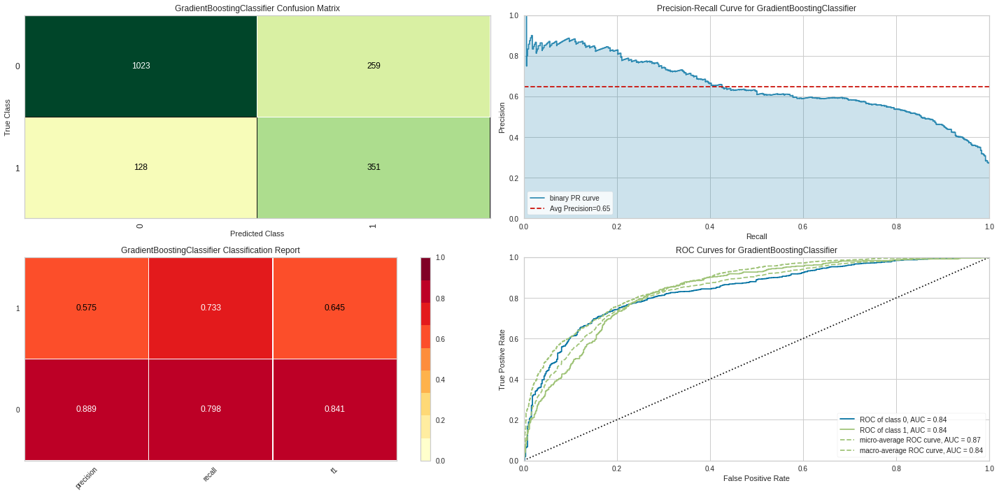

*****HistGradientBoostingClassifier(random_state=12345)*****
Accuracy Score : 0.7864849517319704


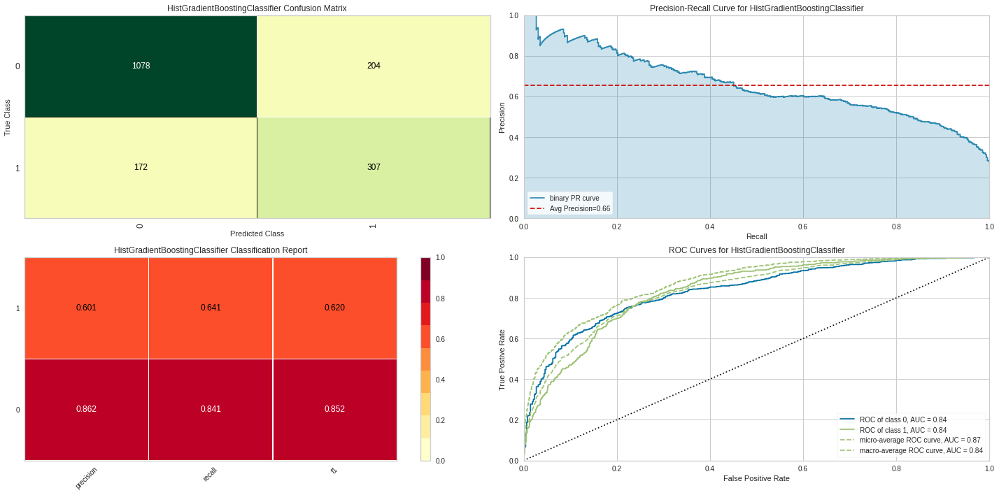

*****AdaBoostClassifier(random_state=12345)*****
Accuracy Score : 0.7722884724588303


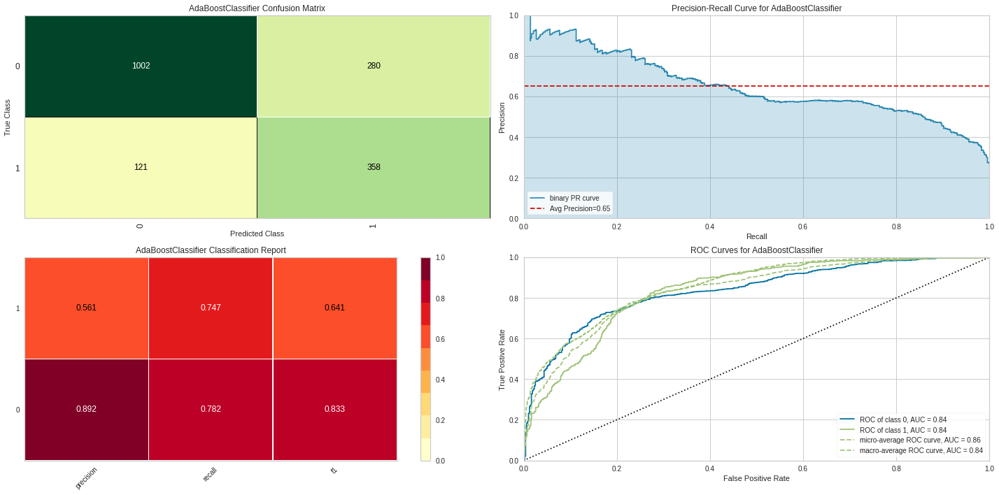

*****GaussianNB()*****
Accuracy Score : 0.7189097103918228


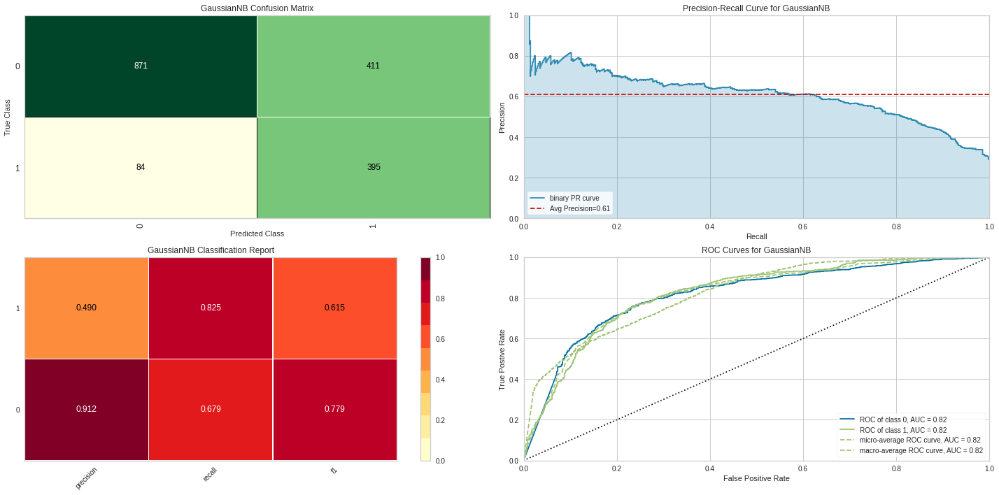

In [246]:
for i in range(len(models)):    
    visualize_result(models[i][1])

# NEW MODEL

In [247]:
for i in df.select_dtypes(include=["object"]).columns:  
    print("-"*5 + str(i) + "-"*5)
    print(df[i].value_counts())  

-----gender-----
Male      3555
Female    3488
Name: gender, dtype: int64
-----SeniorCitizen-----
No     5901
Yes    1142
Name: SeniorCitizen, dtype: int64
-----Partner-----
No     3641
Yes    3402
Name: Partner, dtype: int64
-----Dependents-----
No     4933
Yes    2110
Name: Dependents, dtype: int64
-----PhoneService-----
Yes    6361
No      682
Name: PhoneService, dtype: int64
-----MultipleLines-----
No                  3390
Yes                 2971
No phone service     682
Name: MultipleLines, dtype: int64
-----InternetService-----
Fiber optic    3096
DSL            2421
No             1526
Name: InternetService, dtype: int64
-----OnlineSecurity-----
No                     3498
Yes                    2019
No internet service    1526
Name: OnlineSecurity, dtype: int64
-----OnlineBackup-----
No                     3088
Yes                    2429
No internet service    1526
Name: OnlineBackup, dtype: int64
-----DeviceProtection-----
No                     3095
Yes                    2

In [248]:
#MultipleLines ,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamigTV

df_new=df.replace({"No internet service" : "No","No phone service":"No"})
df_new=pd.get_dummies(df_new,drop_first=True)


In [249]:
df_new.head()

,tenure,MonthlyCharges,TotalCharges,gender_Male,SeniorCitizen_Yes,Partner_Yes,Dependents_Yes,PhoneService_Yes,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_Yes,OnlineBackup_Yes,DeviceProtection_Yes,TechSupport_Yes,StreamingTV_Yes,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,Churn_Yes
0,1,29.85,29.85,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0
1,34,56.95,1889.50,1,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0
2,2,53.85,108.15,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,1
3,45,42.30,1840.75,1,0,0,0,0,0,0,0,1,0,1,1,0,0,1,0,0,0,0,0,0
4,2,70.70,151.65,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1


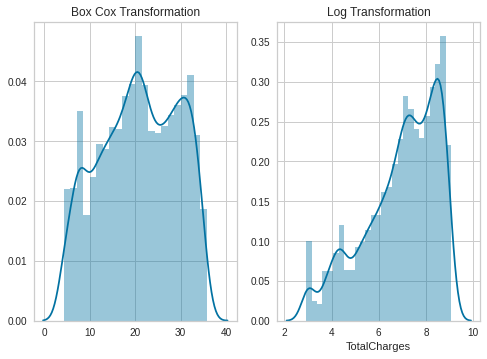

In [250]:
plt.subplot(121)
sns.distplot(np.array(stats.boxcox(df_new.TotalCharges))[0]);
plt.title("Box Cox Transformation");
plt.subplot(122)
sns.distplot(np.log(df_new.TotalCharges));
plt.title("Log Transformation");

In [251]:
df_scaled=df_new.copy()
df_scaled.TotalCharges=np.array(stats.boxcox(df_new.TotalCharges))[0]

In [252]:
scaler=MinMaxScaler()
df_scaled=scaler.fit_transform(df_new)
df_scaled=pd.DataFrame(df_scaled,columns=df_new.columns,index=df_new.index)

In [253]:
df_scaled.head()

,tenure,MonthlyCharges,TotalCharges,gender_Male,SeniorCitizen_Yes,Partner_Yes,Dependents_Yes,PhoneService_Yes,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_Yes,OnlineBackup_Yes,DeviceProtection_Yes,TechSupport_Yes,StreamingTV_Yes,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,Churn_Yes
0,0.013889,0.115423,0.001275,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,0.472222,0.385075,0.215867,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.027778,0.354229,0.010310,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0
3,0.625000,0.239303,0.210241,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.027778,0.521891,0.015330,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0


In [254]:
X=df_scaled.iloc[:,:-1]
y=df_scaled.iloc[:,-1]

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.20, 
                                                    random_state=42)

*****LogisticRegression(random_state=12345)*****
Accuracy Score : 0.8218594748048261


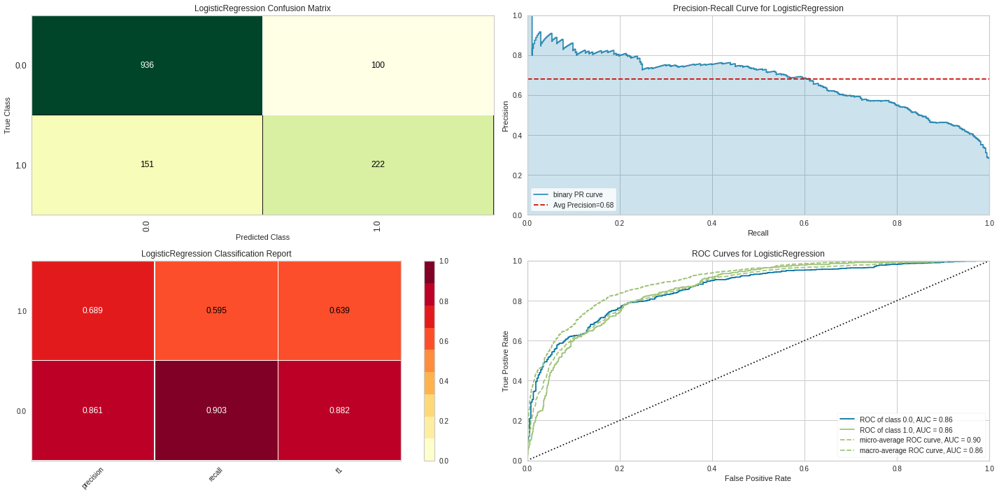

*****KNeighborsClassifier()*****
Accuracy Score : 0.7665010645848119


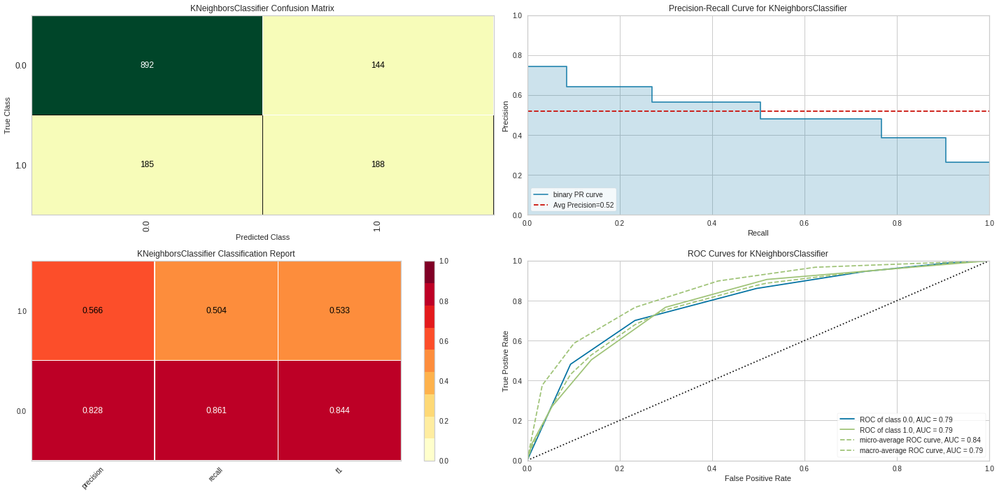

*****DecisionTreeClassifier(random_state=12345)*****
Accuracy Score : 0.7203690560681334


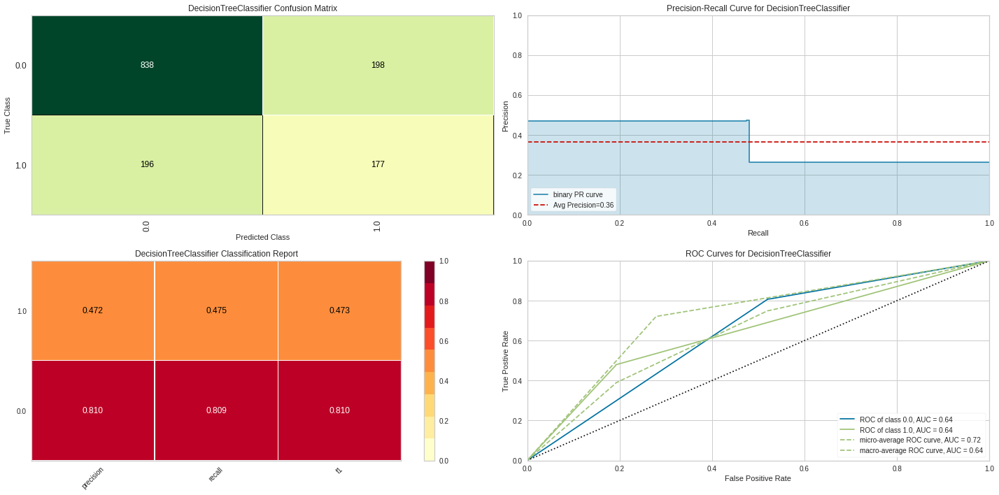

*****RandomForestClassifier(random_state=12345)*****
Accuracy Score : 0.7913413768630234


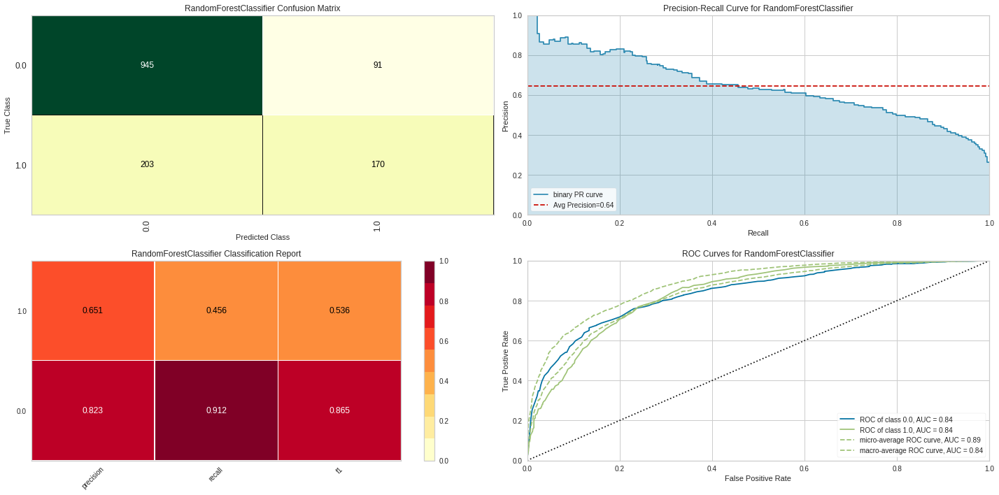

*****LGBMClassifier(random_state=12345)*****
Accuracy Score : 0.8034066713981547


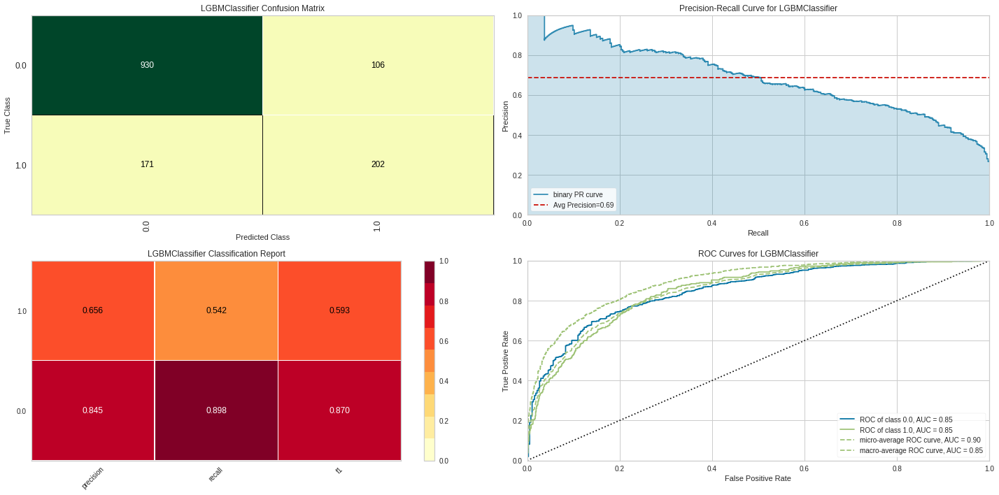

*****XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              random_state=12345, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)*****
Accuracy Score : 0.8041163946061036


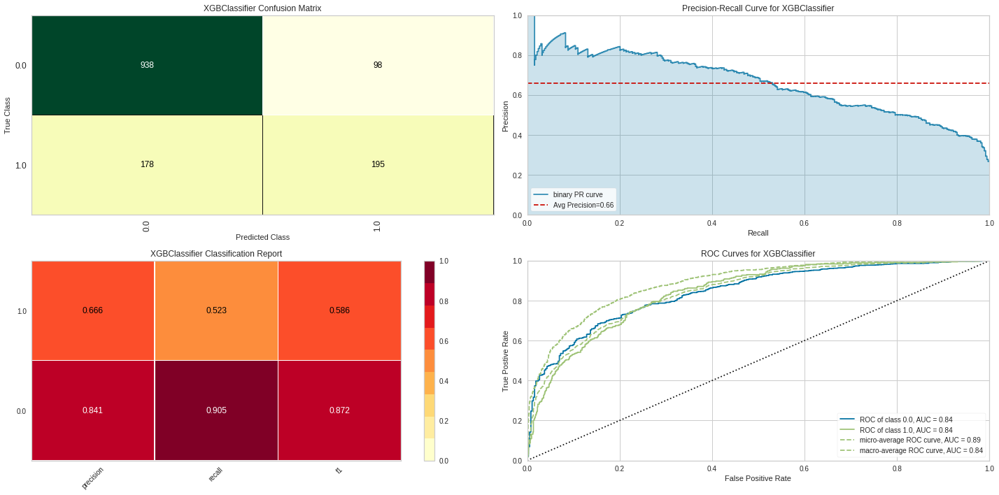

*****GradientBoostingClassifier(random_state=12345)*****
Accuracy Score : 0.8090844570617459


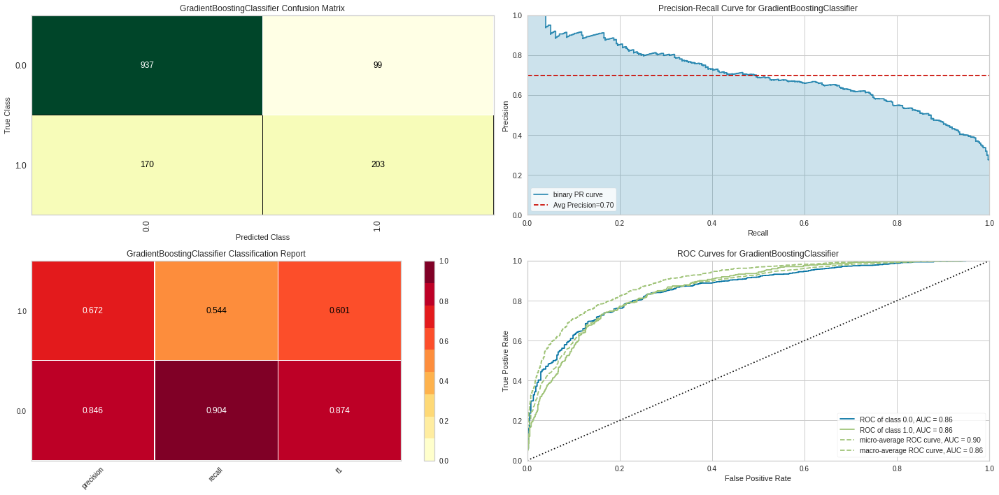

*****HistGradientBoostingClassifier(random_state=12345)*****
Accuracy Score : 0.808374733853797


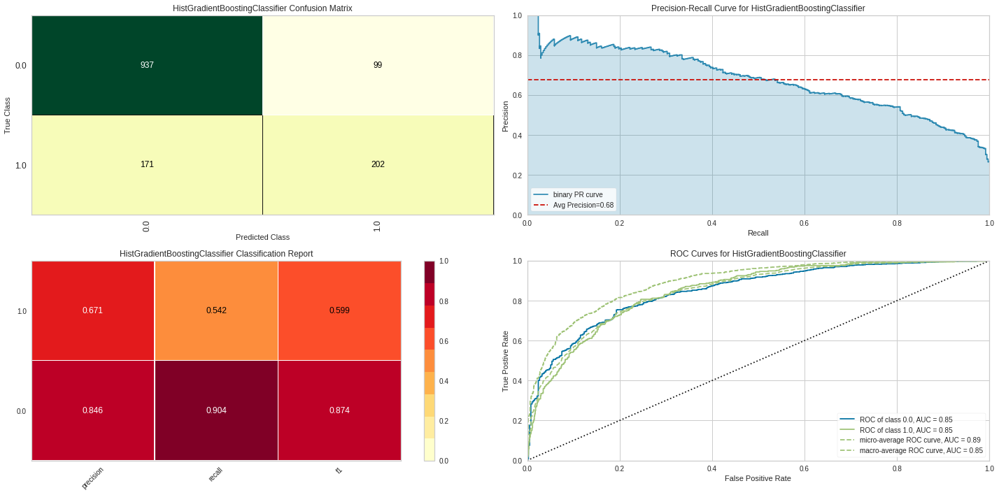

*****AdaBoostClassifier(random_state=12345)*****
Accuracy Score : 0.8197303051809794


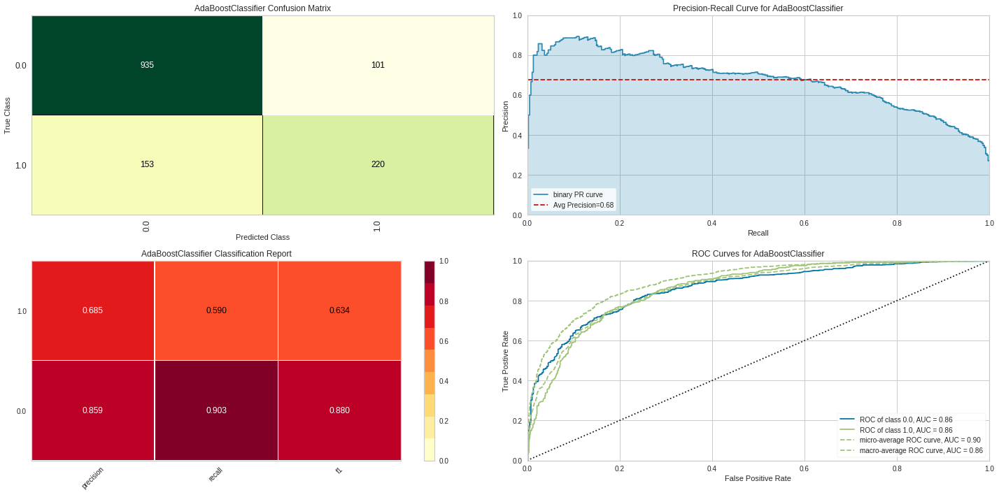

*****GaussianNB()*****
Accuracy Score : 0.7601135557132718


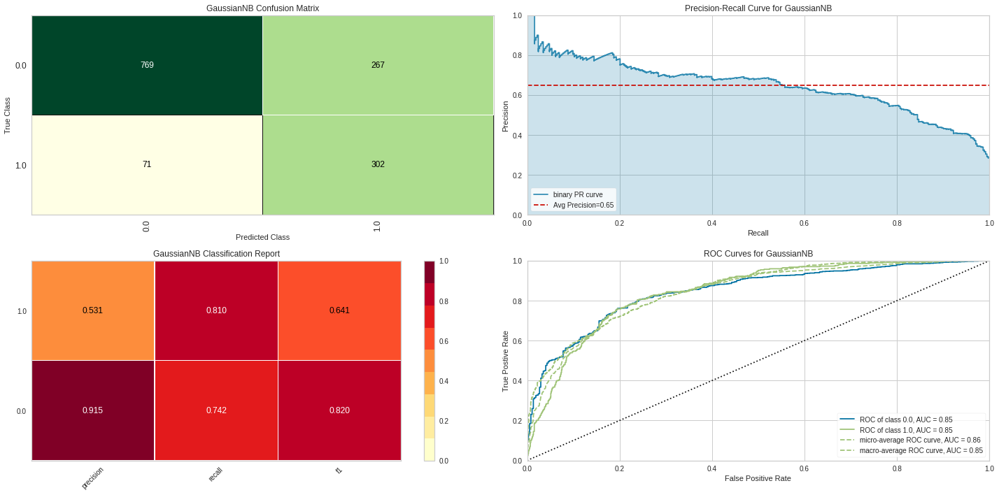

In [255]:
for i in range(len(models)):    
    visualize_result(models[i][1])

# UNDERSAMPLING ON NEW MODEL

*****LogisticRegression(random_state=12345)*****
Accuracy Score : 0.7512776831345827


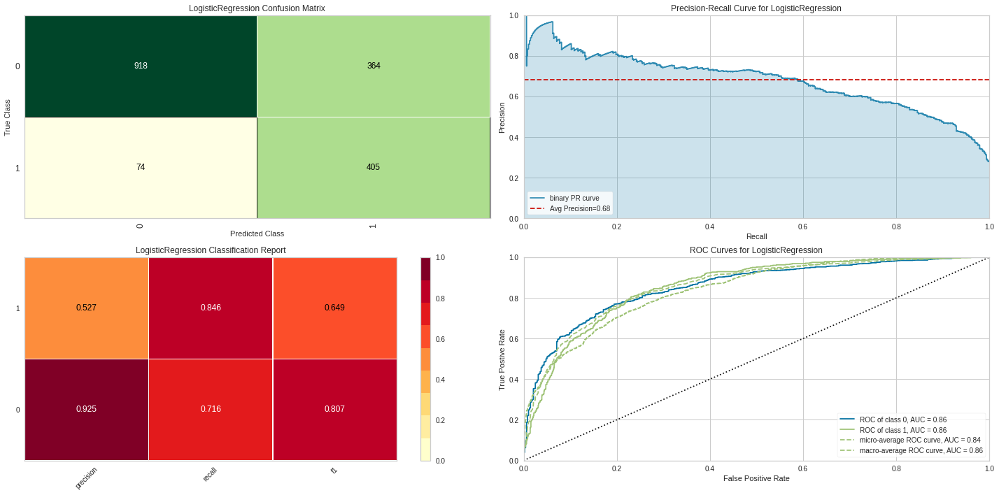

*****KNeighborsClassifier()*****
Accuracy Score : 0.6905167518455423


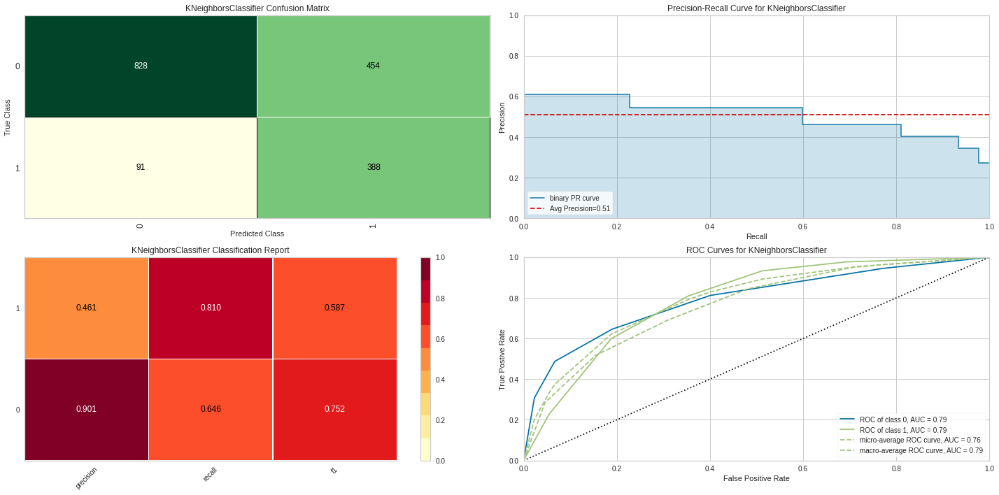

*****DecisionTreeClassifier(random_state=12345)*****
Accuracy Score : 0.6689381033503691


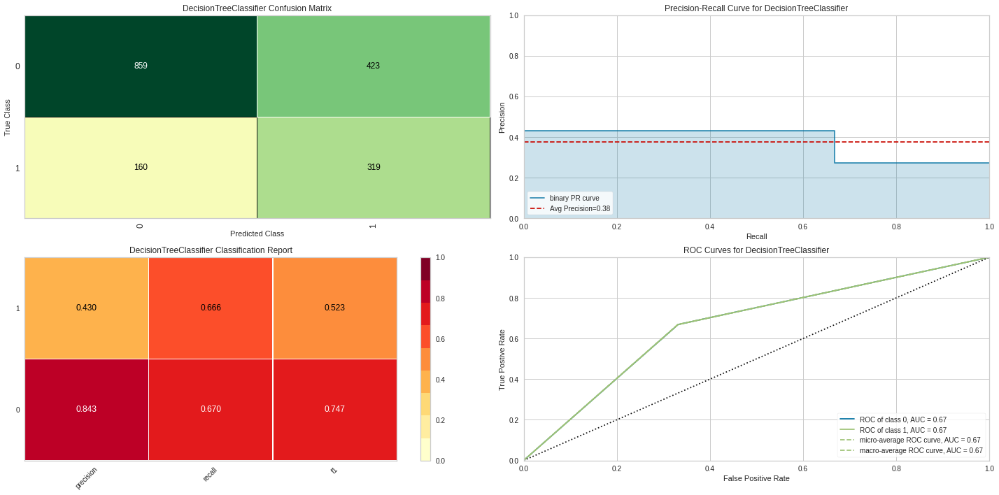

*****RandomForestClassifier(random_state=12345)*****
Accuracy Score : 0.7410562180579217


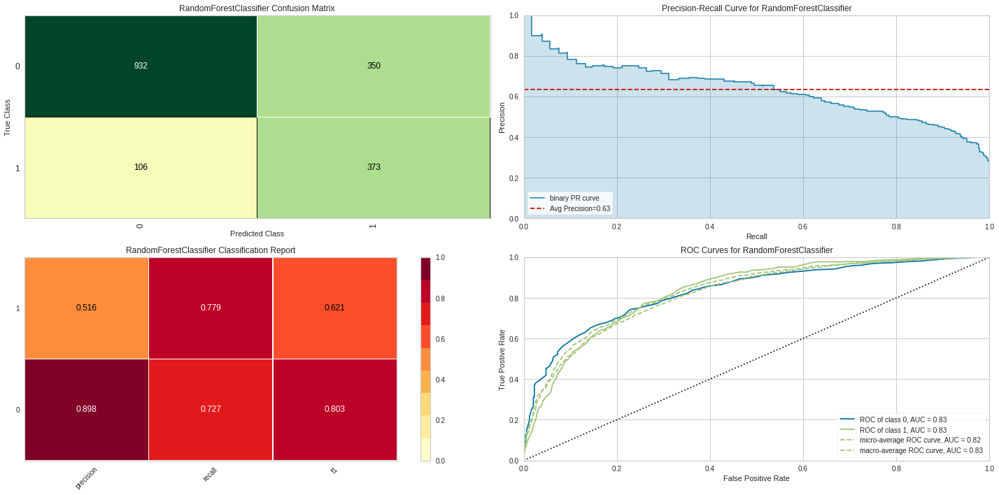

*****LGBMClassifier(random_state=12345)*****
Accuracy Score : 0.7336740488358887


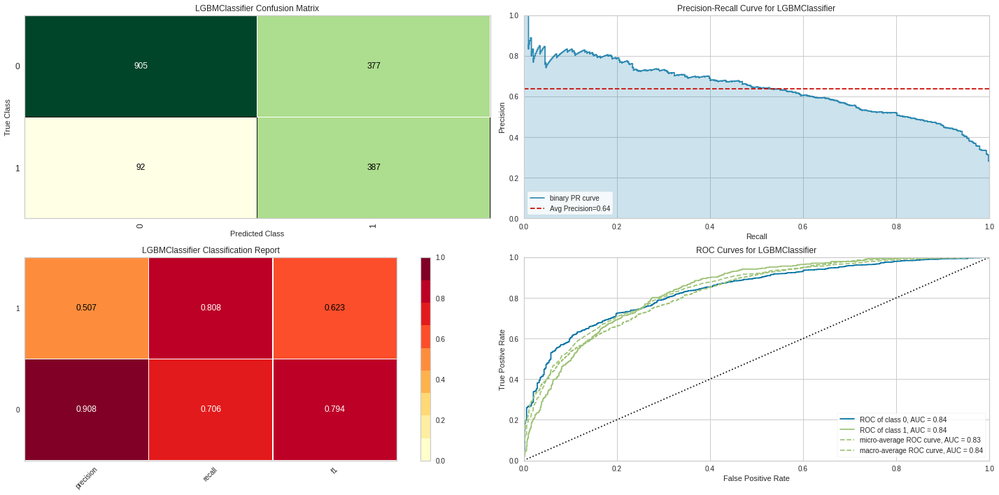

*****XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              random_state=12345, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)*****
Accuracy Score : 0.7342419080068143


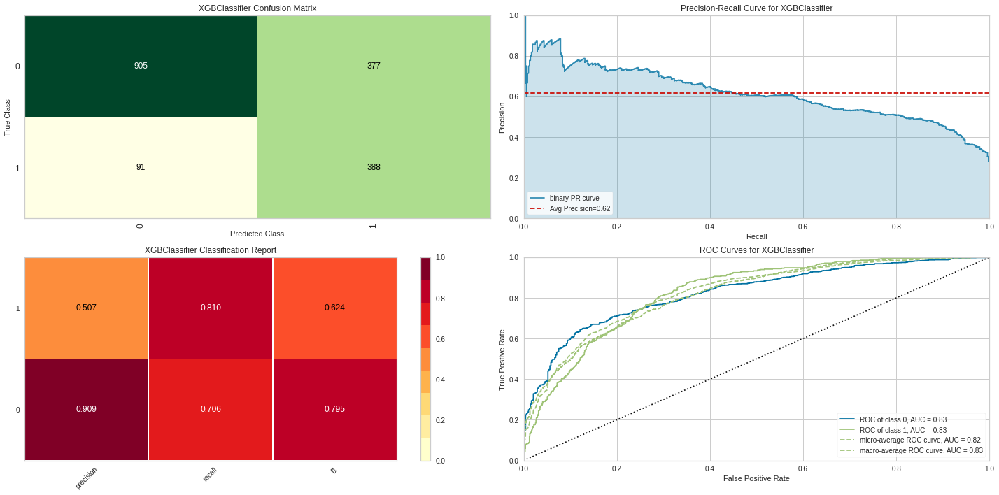

*****GradientBoostingClassifier(random_state=12345)*****
Accuracy Score : 0.7450312322544009


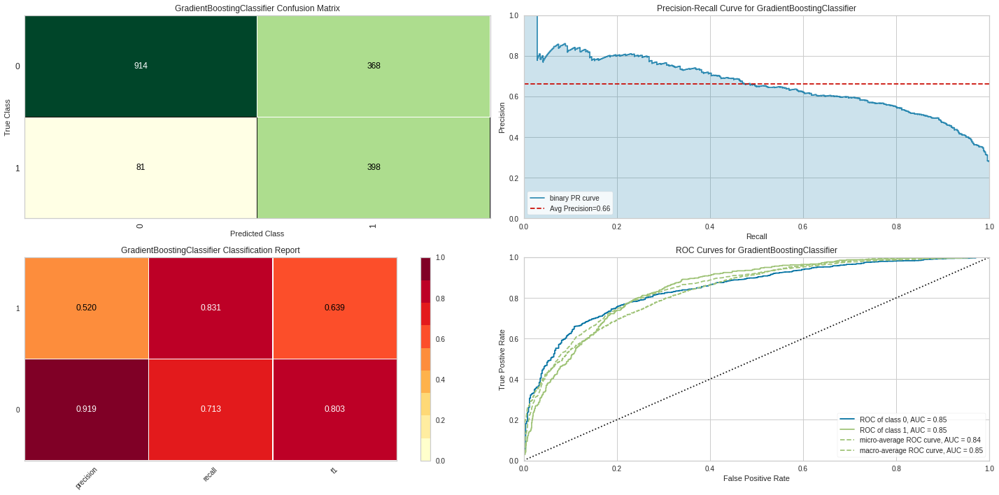

*****HistGradientBoostingClassifier(random_state=12345)*****
Accuracy Score : 0.7342419080068143


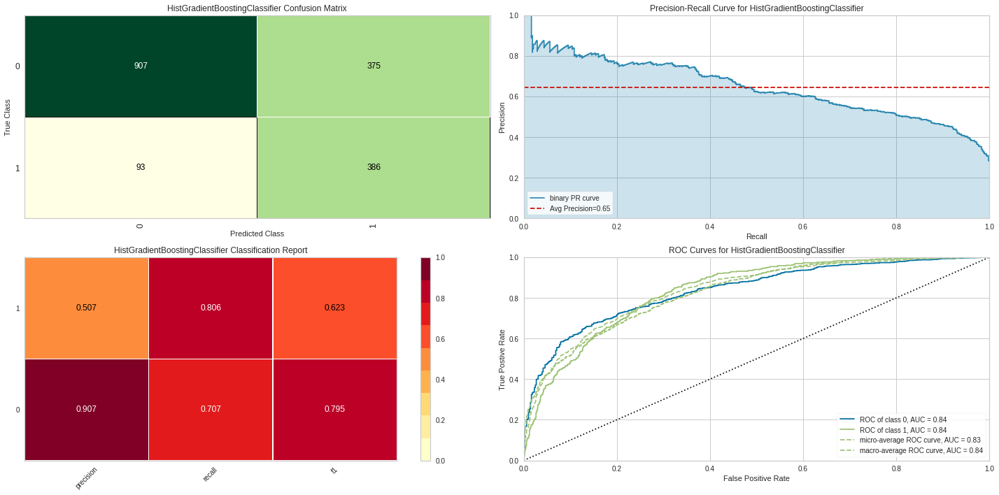

*****AdaBoostClassifier(random_state=12345)*****
Accuracy Score : 0.7421919363997729


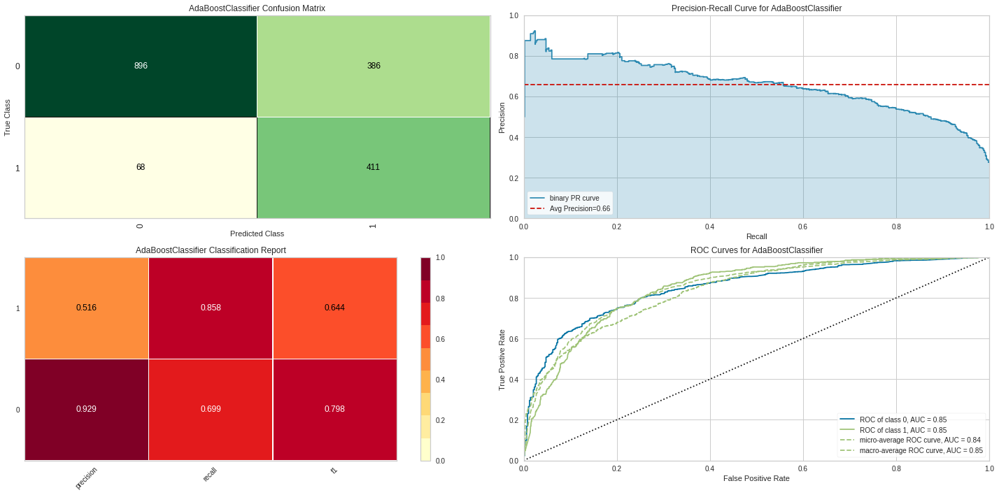

*****GaussianNB()*****
Accuracy Score : 0.7336740488358887


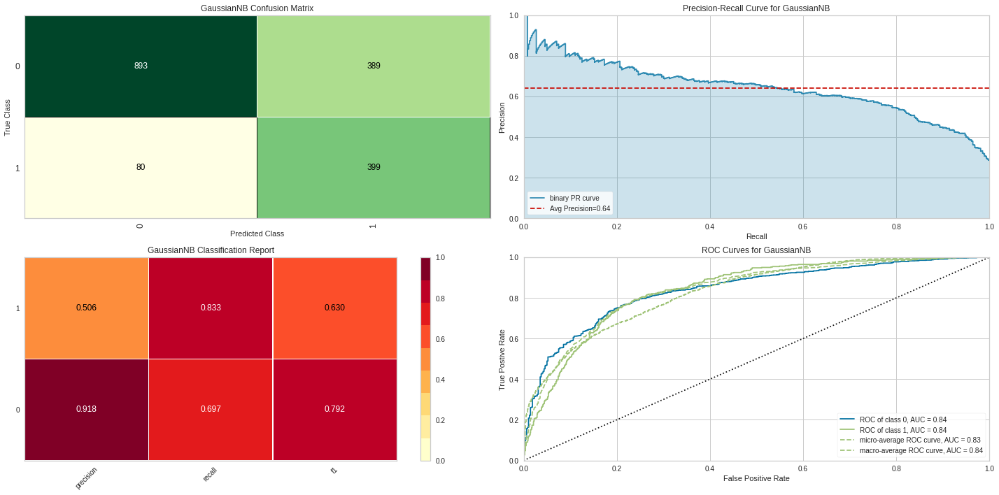

In [256]:
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.25,random_state=42)
rus = RandomUnderSampler()
X_train, y_train = rus.fit_sample(X_train, y_train)
y_train = y_train.astype(int)

for i in range(len(models)):    
    visualize_result(models[i][1])

# OVERSAMPLING ON NEW MODEL

In [257]:
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.20,random_state=42)
smt = SMOTE()
X_train, y_train = smt.fit_sample(X_train, y_train)
y_train = y_train.astype(int)

*****LogisticRegression(random_state=12345)*****
Accuracy Score : 0.7601135557132718


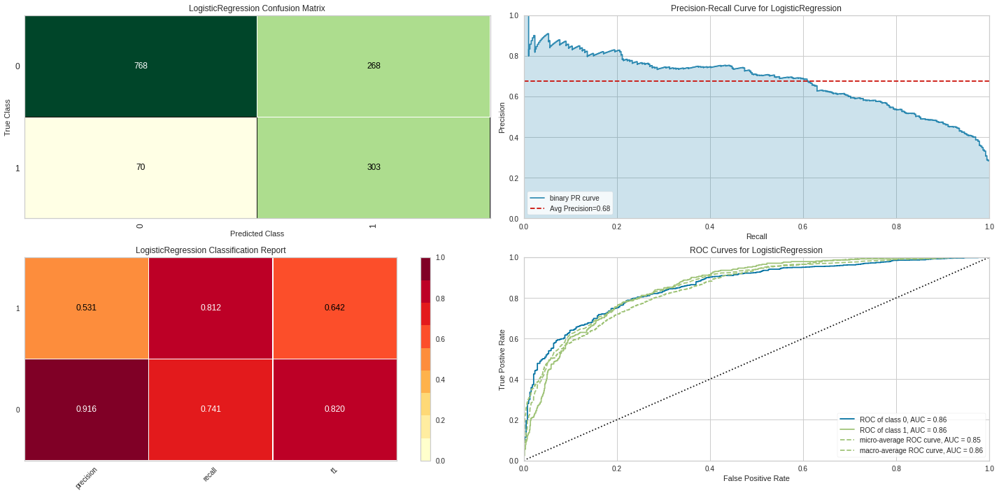

*****KNeighborsClassifier()*****
Accuracy Score : 0.7004968062455642


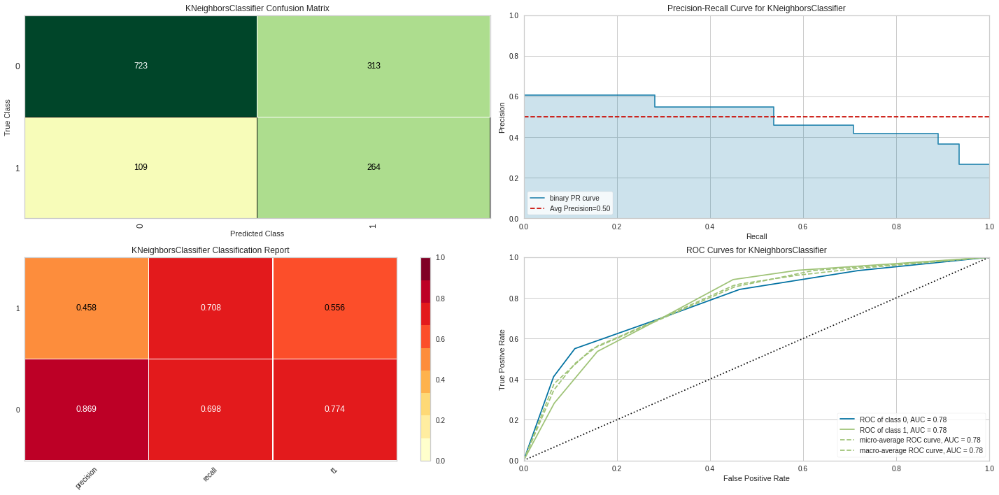

*****DecisionTreeClassifier(random_state=12345)*****
Accuracy Score : 0.7253371185237757


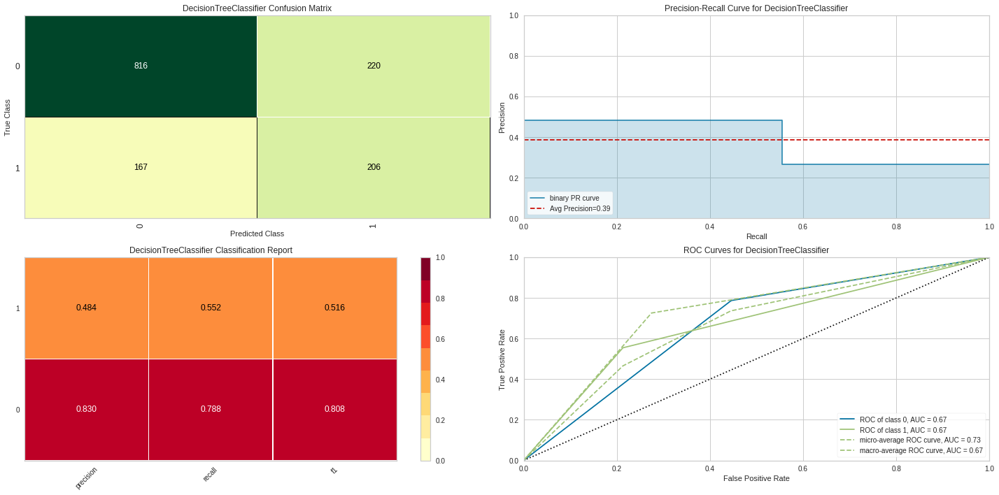

*****RandomForestClassifier(random_state=12345)*****
Accuracy Score : 0.7849538679914834


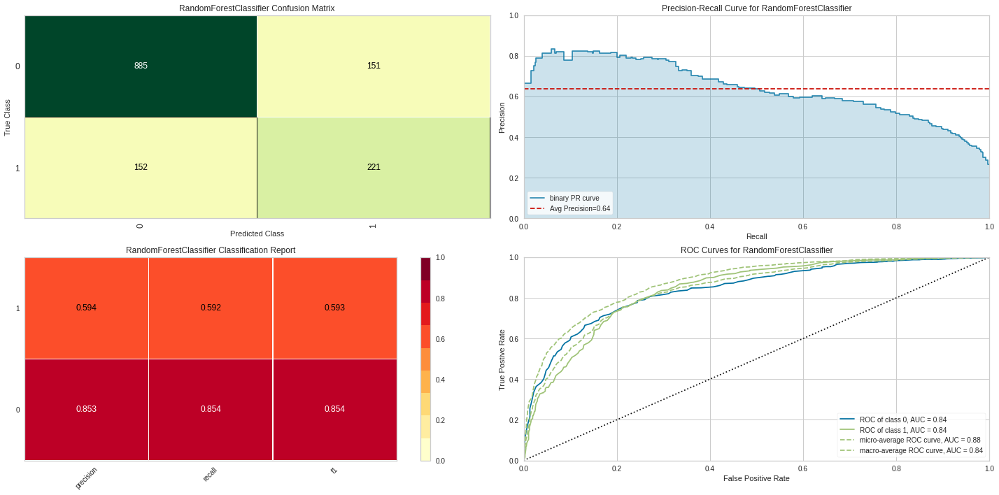

*****LGBMClassifier(random_state=12345)*****
Accuracy Score : 0.7913413768630234


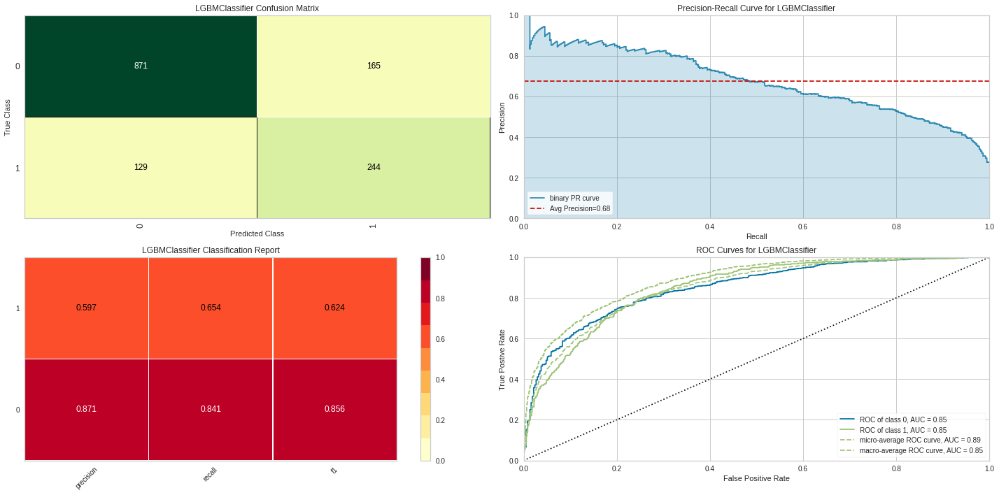

*****XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              random_state=12345, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)*****
Accuracy Score : 0.78708303761533


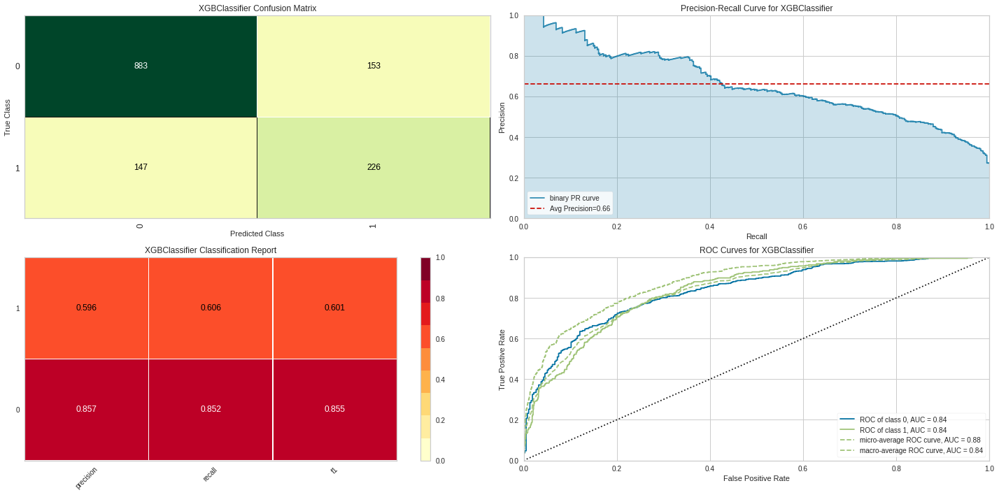

*****GradientBoostingClassifier(random_state=12345)*****
Accuracy Score : 0.7955997161107168


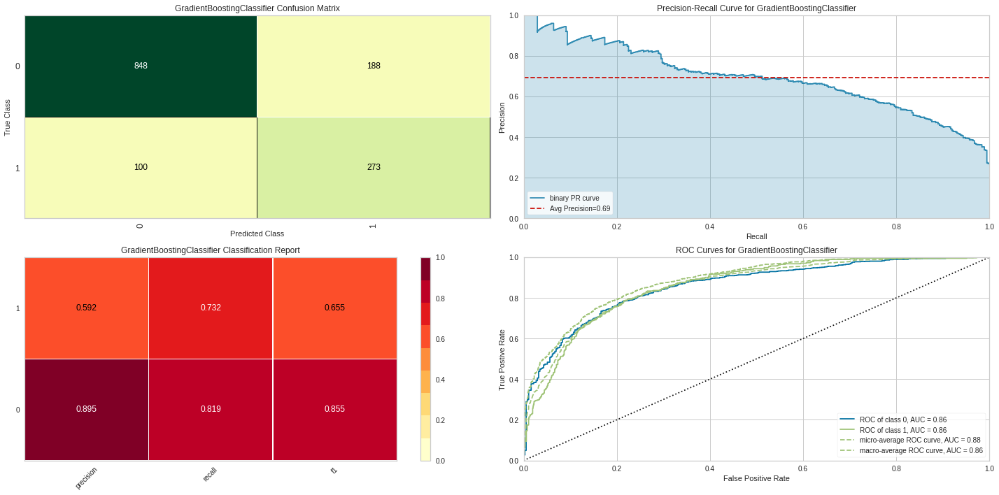

*****HistGradientBoostingClassifier(random_state=12345)*****
Accuracy Score : 0.8005677785663591


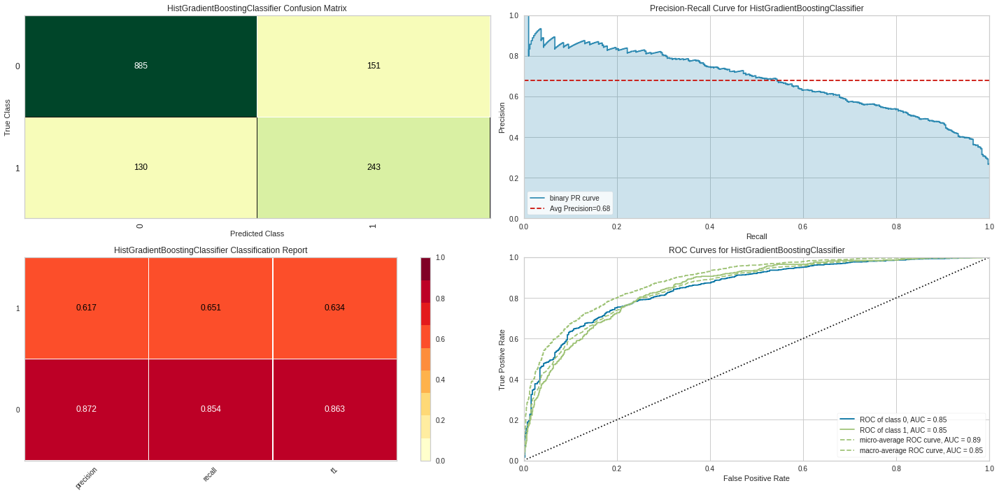

*****AdaBoostClassifier(random_state=12345)*****
Accuracy Score : 0.7721788502484032


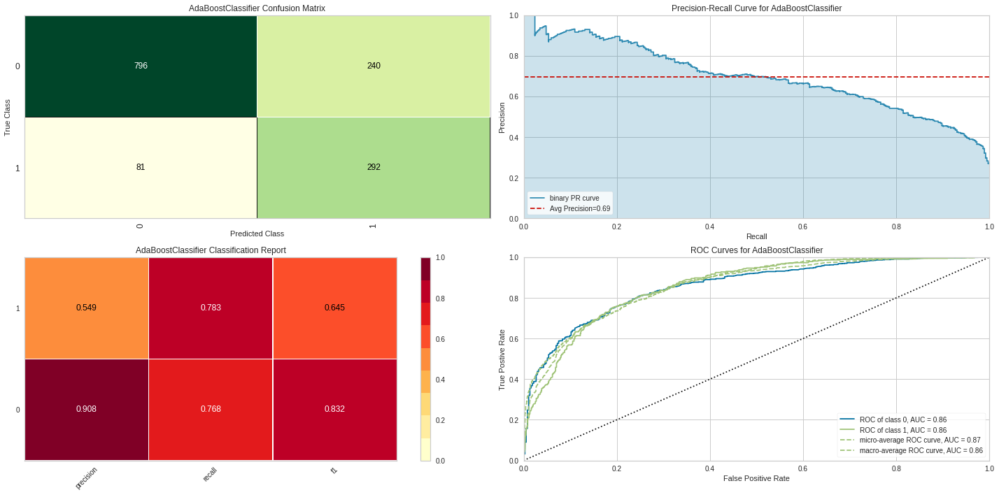

*****GaussianNB()*****
Accuracy Score : 0.7530163236337828


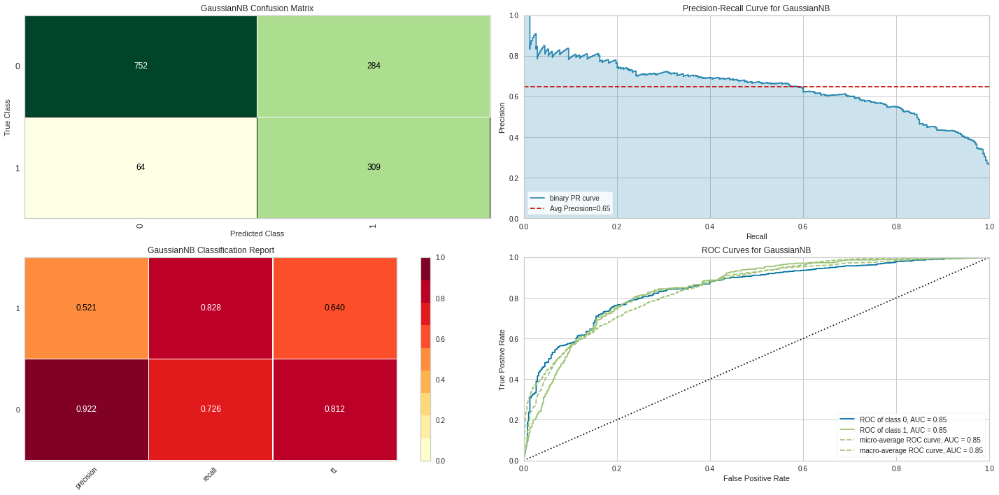

In [258]:
for i in range(len(models)):    
    visualize_result(models[i][1])